In [1]:
from IPython.core.interactiveshell import InteractiveShell
import time

old_run_cell = InteractiveShell.run_cell

def timing_run_cell(self, raw_cell, *args, **kwargs):
    t0 = time.time()
    result = old_run_cell(self, raw_cell, *args, **kwargs)
    t1 = time.time()
    print(f"Execution time: {t1 - t0:.4f} seconds")
    return result

InteractiveShell.run_cell = timing_run_cell

# Import packages

In [2]:
import scipy.interpolate as spl
from matplotlib.pyplot import figure, show
import matplotlib.pyplot as plt
import numpy as np
import sys
from functools import partial
import warnings
import os
import itertools
import pandas as pd
from decimal import Decimal, getcontext
import scipy.optimize as optimize
import matplotlib as mpl
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.cm as cm
import scipy.integrate as spint
from fractions import Fraction
import multiprocessing as mp
from concurrent.futures import ProcessPoolExecutor
from concurrent.futures import ThreadPoolExecutor

Execution time: 2.9819 seconds


# Load Observational Data

In [3]:
BARY = pd.read_csv('../data/baryons.csv')
TOTAL = pd.read_csv('../data/galaxies_total_sample.csv')

BARY['Mass(Msun)'] =  pd.to_numeric(BARY['Mass(Msun)'], errors='coerce')
BARY['e_Mass(Msun)'] =  pd.to_numeric(BARY['e_Mass(Msun)'], errors='coerce')
BARY['j'] =  pd.to_numeric(BARY['j'], errors='coerce')
BARY['e_j'] =  pd.to_numeric(BARY['e_j'], errors='coerce')
BARY['fgas'] =  pd.to_numeric(BARY['fgas'], errors='coerce')
BARY['e_fgas'] =  pd.to_numeric(BARY['e_fgas'], errors='coerce')

TOTAL['Mstar'] =  pd.to_numeric(TOTAL['Mstar'], errors='coerce')
TOTAL['e_Mstar'] =  pd.to_numeric(TOTAL['e_Mstar'], errors='coerce')
TOTAL['Mgas'] =  pd.to_numeric(TOTAL['Mgas'], errors='coerce')
TOTAL['e_Mgas'] =  pd.to_numeric(TOTAL['e_Mgas'], errors='coerce')
TOTAL['jstar'] =  pd.to_numeric(TOTAL['jstar'], errors='coerce')
TOTAL['e_jstar'] =  pd.to_numeric(TOTAL['e_jstar'], errors='coerce')
TOTAL['jgas'] =  pd.to_numeric(TOTAL['jgas'], errors='coerce')
TOTAL['e_jgas'] =  pd.to_numeric(TOTAL['e_jgas'], errors='coerce')

obs_Mbar = np.log10(BARY['Mass(Msun)'])
obs_Mbar_errors = BARY['e_Mass(Msun)']/BARY['Mass(Msun)']
obs_Mgas = np.log10(TOTAL['Mgas'])
obs_Mgas_errors = TOTAL['e_Mgas']/TOTAL['Mgas']
obs_Mstar = np.log10(TOTAL['Mstar'])
obs_Mstar_errors = TOTAL['e_Mstar']/TOTAL['Mstar']
obs_jbar = np.log10(BARY['j'])
obs_jbar_errors = BARY['e_j']/BARY['j']
obs_jgas = np.log10(TOTAL['jgas'])
obs_jgas_errors = TOTAL['e_jgas']/TOTAL['jgas']
obs_jstar = np.log10(TOTAL['jstar'])
obs_jstar_errors = TOTAL['e_jstar']/TOTAL['jstar']
obs_fgas = np.log10(BARY['fgas'])
obs_fgas_errors = BARY['e_fgas']/BARY['fgas']
obs_fgas_but_for_stars_and_gas = TOTAL['Mgas']/(TOTAL['Mgas'] + TOTAL['Mstar'])
obs_fgas_but_for_stars_and_gas_errors = np.sqrt( (TOTAL['e_Mgas']/(TOTAL['Mgas'] + TOTAL['Mstar']))**2 + (TOTAL['Mgas']*TOTAL['e_Mstar']/((TOTAL['Mgas'] + TOTAL['Mstar'])**2))**2 )

pavel_dir = '../data/compilation_AM_others/'

pavel_data = {}

for filename in os.listdir(pavel_dir):
    if filename.endswith('.csv'):
        filepath = os.path.join(pavel_dir, filename)
        
        df = pd.read_csv(filepath)
        
        df_name = os.path.splitext(filename)[0]
        #add to superthin: 9.04,2.95,9.85,0.55,9.912537485,2.088484546,0.8658895825
        pavel_data[df_name] = df

HIX_logMstar = np.array([10.5, 10.7, 10.5, 10.5, 10.3, 10.2,  9.8, 10.1, 10.1, 10.1, 10.6, 10.5])
HIX_logMHI = np.log10(1.33 * 10**np.array([10.6, 10.7, 10.5, 10.5, 10.4, 10.3,  9.9, 10.3, 10.4, 10.3, 10.9, 10.5]))
HIX_logMbar = np.log10(10**HIX_logMstar + 10**HIX_logMHI)
HIX_fgas = (10**HIX_logMHI)/(10**HIX_logMbar)
HIX_jbar = np.array([4125.6, 3523.8, 5453.1, 4092.4, 3522.7, 3749.8, 1993. , 3196.7, 3388.2, 6377.8, 9764. , 4117.7])

Execution time: 0.0308 seconds


# Model definition

$j_{acc}(t) = 2v_{rot}(t)r_{acc}(t) \rightarrow r_{acc}(t) = \frac{j_{acc}(t)}{2 v_{rot}(t)}$ where $j_{acc}(t)=j_{min}+ k\cdot (j_{max}-j_{min}) \left( \frac{t}{t_0} \right)^n$ (start with n=1), and $v_{rot}(t) = \left( \frac{M_{bar}(t_0)}{A_G} \right)^{1/4}$

1) Determine $r_{acc}$ by determining $j_{acc}(t)$ and $v_{rot}(t)$:

   a) Determine $M_{bar}(t)$ from $M_{bar}(t) = \int_0^t Ce^{\frac{t'}{t_{acc}}} \,dt$.  This gives $v_{rot}(t)$.
   
   b) Determine $j_{max}$ from $\log(j_{max}(M_{bar})) = 0.73\log(M_{bar})-4.25$ (as $j_{max}$ is when $f_{gas}=1 \rightarrow \log(f_{gas})=0$)
   
   c) Determine $j_{acc}(t)$ from $j_{max}(M_{bar})$
   
2) Solve $\frac{\mathrm{d} \Sigma_{gas}(t,R)}{\mathrm{d} t} = \frac{C}{2 \pi r_{acc}(t)^2} e^{-\frac{t}{t_{acc}}} e^{-\frac{R}{r_{acc}(t)}} - A(1-\Re) \Sigma_{gas}^N(t,R)$ given $r_{acc}(t)$ from above

## 1) Determine $𝑟_{𝑎𝑐𝑐}$  by determining  $𝑗_{𝑎𝑐𝑐}(𝑡)$  and  $𝑣_{𝑟𝑜𝑡}(𝑡)$

### a) Determine $M_{bar}(t)$ from $M_{bar}(t) = \int_0^t Ce^{\frac{t'}{t_{acc}}} \,dt$

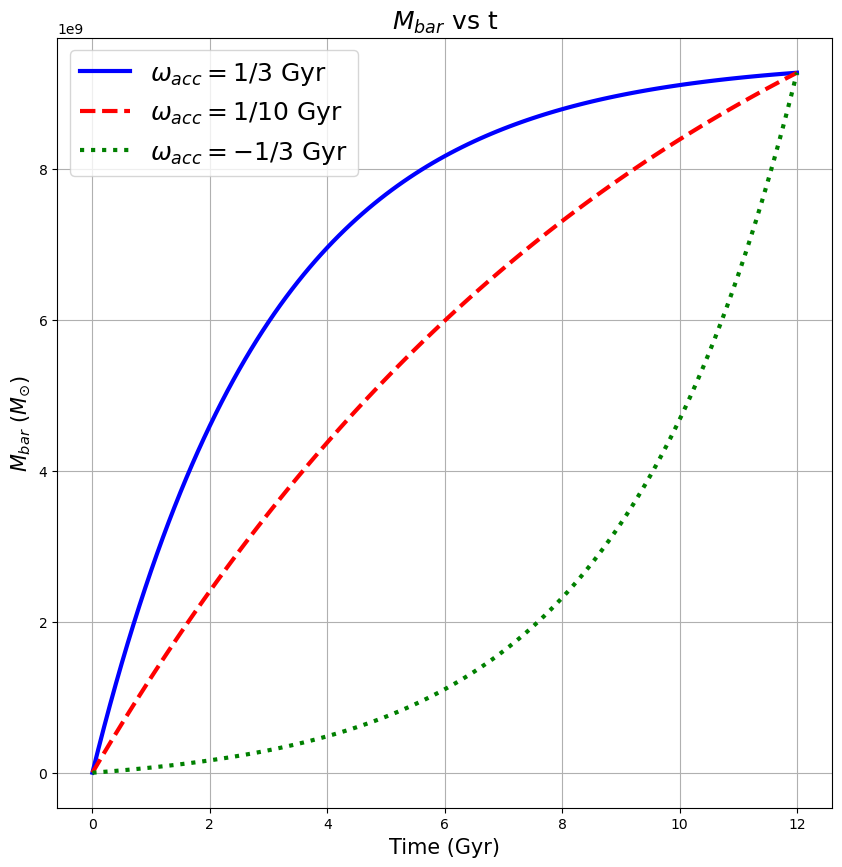

Execution time: 0.6450 seconds


In [4]:
dt=0.1
M_times = np.arange(0,12.1,dt)

def C_def(M_bar, t_acc, t0=12.):
    """Returns the normalization constant by imposing a value of the baryonic mass at a given
    time and accretion timescale. Default time is taken as today, t_0 = 12Gyr."""
    if (t_acc==np.inf):
        return M_bar/t0
    elif (t_acc<0):
        return M_bar/(abs(t_acc)*(np.exp(t0/abs(t_acc))-1))
    else:
        return M_bar/(t_acc*(1-np.exp(-t0/t_acc)))

def M_def(M_bar, t_acc, t=M_times, dt=dt):
    """Returns the baryonic mass predicted from the accreting mass having an exponential form in time."""
    C = C_def(M_bar, t_acc)
    if (t_acc==np.inf):
        return C*t
    elif (t_acc<0):
        return C*abs(t_acc)*(np.exp(t/abs(t_acc))-1)
    else:
        return C*t_acc*(1-np.exp(-t/t_acc))

t_acc = np.array([3.,10.,-3.]) #GYr
colors = ['b', 'r', 'g']
styles = ['solid', 'dashed', 'dotted']

M_bar_t0 = 9.27e9
M_bar_array = np.zeros((len(t_acc),len(M_times)))
for i, t_accr in enumerate(t_acc):
    M_bar_array[i] = M_def(M_bar_t0, t_accr)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colors, styles):
    frame.plot(M_times, M_bar_array[i], label = fr"$\omega_{{acc}} = {Fraction(1,int(t_accr))}$ Gyr", color=col, linestyle=sty, lw=3)
frame.set_title(r"$M_{bar}$ vs t", fontsize = 18)
frame.set_xlabel(r"Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{bar}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
pd.DataFrame(M_bar_array.T, columns=['t_acc=3Gyr', 't_acc=10Gyr', 't_acc=25Gyr']).to_csv('../data/data8_alternative_KSL/M_bar_vs_'+f'{np.log10(M_bar_t0)}'+'.csv')
fig.savefig('../outputs/graphs9_alternative_KSL/M_bar vs time (t_acc variation).png')

### a) i) Find $v_{BTFR}$ from $M_{bar}$ (constant in time)

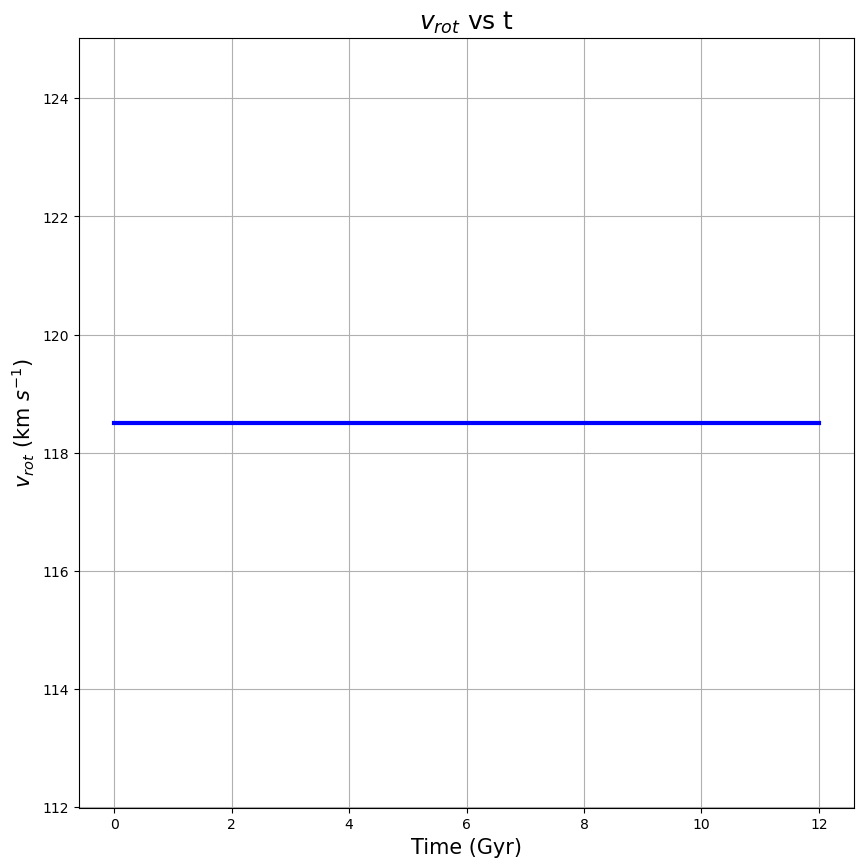

Execution time: 0.2554 seconds


In [5]:
def v_btfr_def(M_bar, Ag=47):
    """Returns the value of the velocity from the baryonic Tully-Fisher relation. The default constant
    value Ag is taken from McGaugh (2012)."""
    return (M_bar/Ag)**0.25

Ag = 47 #M_{\odot} km^{-4} s^{-4}
M_bar_allsame = np.full(M_bar_array[0].shape, M_bar_t0)
v_btfr_array = v_btfr_def(M_bar_allsame)
#print(v_rot_array)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, v_btfr_array, color="blue", lw=3)
frame.set_title(r"$v_{rot}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$v_{rot}$ (km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.grid()
show()
np.savetxt('../data/data8_alternative_KSL/v_rot_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', v_btfr_array)
fig.savefig('../outputs/graphs9_alternative_KSL/v_btfr vs time (t_acc variation).png')

### b) Determine $j_{max}$ from $\log(j_{max}(M_{bar})) = 0.73\log(M_{bar})-4.25$

In [6]:
def j_maxer(Mbar):
    """Returns the maximum value of the accreting angular momentum. This is determined empirically, by 
    utilizing the fit found by Mancera-Piña et al. (2021), and setting f_gas = 1. This is because the
    theoretical maximum accreting angular momentum should fall where there is maximum gas, in the outer-most
    regions of the galaxy."""
    return (Mbar**0.73)*10**(-4.25)

j_max = (M_bar_t0**0.73)*10**(-4.25)
print(j_max)

1061.6178348386752
Execution time: 0.0007 seconds


### c) Determine $j_{acc}(t)$ from $j_{max}(M_{bar})$

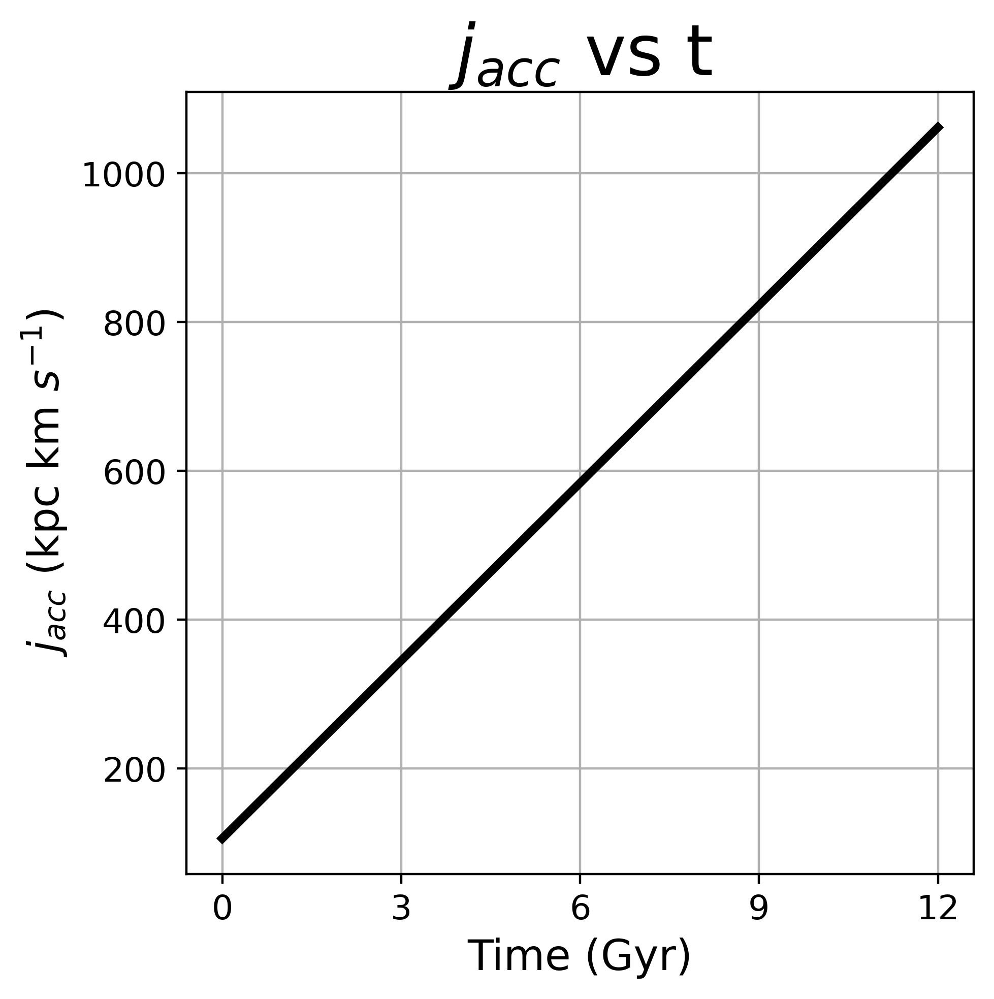

Execution time: 0.5245 seconds


In [7]:
def j_acc_def(j_max, Mbar, t, t0=12, n=1, con=1):
    """Determines the accreting specific angular momentum given j_max, the velocity from the BTFR, at any
    given time. The minimum angular momentum is determined from the mass-scale relation by Wu (2017) and 
    divided by 5. This was chosen as a value that is just high enough to not give errors in later calculations when small
    r_acc gives infinities."""
    #r_acc_min = (10**(0.385*(np.log10(Mbar)-10)+0.281))/5
    j_min = j_max/10.
    return j_min+con*(j_max-j_min)*(t/t0)**n

j_acc_array = j_acc_def(j_max, M_bar_allsame, M_times)

fig = figure(figsize=(5,5), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, j_acc_array, color="k", lw=3)
frame.set_title(r"$j_{acc}$ vs t", fontsize = 25)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{acc}$ (kpc km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.tick_params(labelsize=12)
frame.set_xticks([0, 3, 6, 9, 12])
frame.grid()
show()
np.savetxt('../data/data8_alternative_KSL/j_acc_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', j_acc_array)
fig.savefig('../outputs/graphs9_alternative_KSL/j_acc vs time (t_acc variation).png')

### d) Determine $r_{BTFR}(t)$ from $j_{acc}(t) = 2v_{flat} \left( r_{acc} - \frac{R_v^3 r_{acc}}{(R_v+r_{acc})^3} \right)$

In [8]:
def rv_def(M_bar, kpc=True):
    if kpc:
        return -0.005034150233993362*v_btfr_def(M_bar)+2.6658196850679956
    else:
        return -5.034150233993362*v_btfr_def(M_bar)+2665.8196850679956

rv_def(10**10)

2.0578223054087963

Execution time: 0.0025 seconds


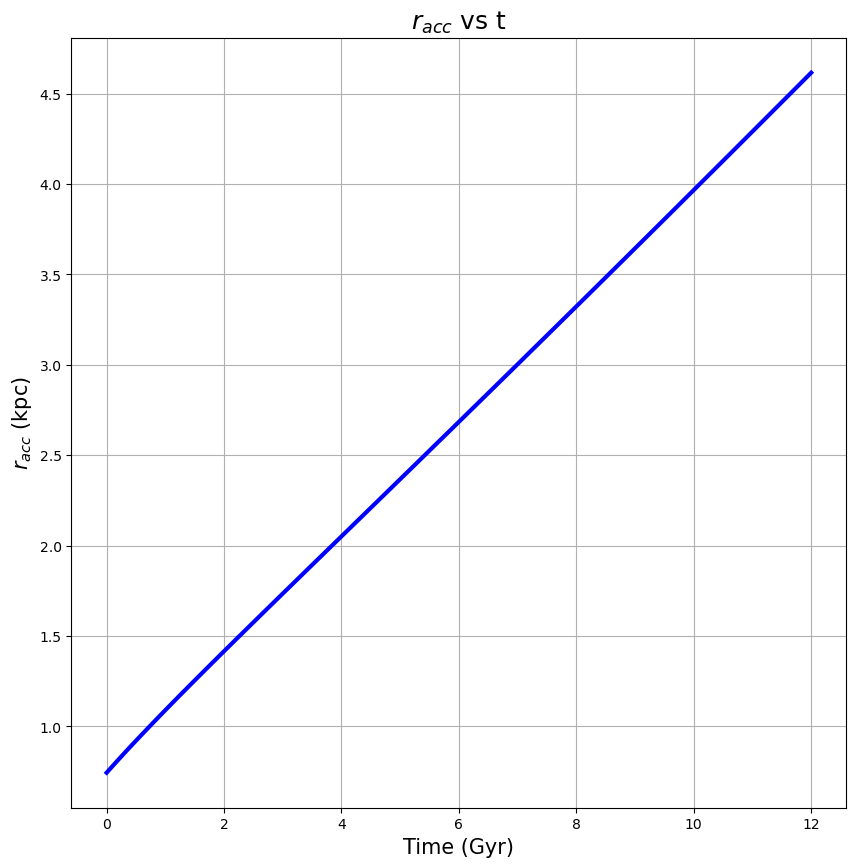

Execution time: 0.2398 seconds


In [9]:
def analytical_r(x, c, y):
    return x - (c**3 * x) / (c + x)**3 - y

def r_btfr_def(M_bar, j_acc, init=1.0):
    
    rv = rv_def(M_bar, kpc=True)
    yer = j_acc / (2*v_btfr_def(M_bar))
    if hasattr(yer, '__len__'):
        r_acc = []
        for i in range(len(j_acc)):
            r_acc.append(optimize.newton(analytical_r, init, args=(rv[i], yer[i])))
        return np.array(r_acc)
    else:
        return optimize.newton(analytical_r, init, args=(rv, yer))

r_btfr_array = r_btfr_def(M_bar_allsame, j_acc_array)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times, r_btfr_array, color="blue", lw=3)
frame.set_title(r"$r_{acc}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$r_{acc}$ (kpc)", fontsize = 15)
#frame.legend(prop={'size': 18})
frame.grid()
show()
np.savetxt('../data/data8_alternative_KSL/r_acc_vs_t_'+f'{np.log10(M_bar_t0)}'+'.txt', r_btfr_array)
fig.savefig('../outputs/graphs9_alternative_KSL/r_acc vs time (t_acc variation).png')

### e) Analytical $j_{bar}$

/tmp/ipykernel_1582953/887608871.py:5: RuntimeWarning: divide by zero encountered in divide
  return dt*np.cumsum(acc_j*M_dot_bar)/bar_mass


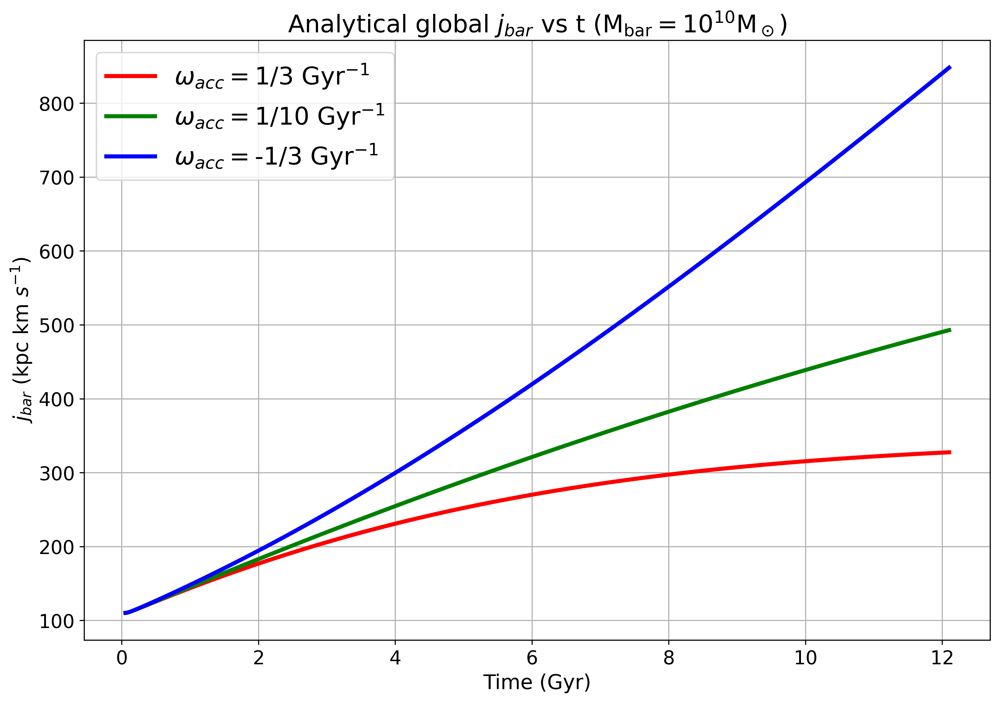

Execution time: 1.6953 seconds


In [10]:
def j_bar_analytical(t, Mbar, t_acc, dt=0.1):
    bar_mass = M_def(Mbar, t_acc, t)
    M_dot_bar = C_def(Mbar, t_acc)*np.exp(-t/t_acc)
    acc_j = j_acc_def(j_maxer(Mbar), Mbar, t)
    return dt*np.cumsum(acc_j*M_dot_bar)/bar_mass

colorz = ['r', 'g', 'b']
stylez = ['dashed', 'dotted', 'solid']

M_times2 = np.arange(0, 12.101, 0.001)
j_bar_array_analytical = np.zeros((len(t_acc),len(M_times2)))
for i, t_accr in enumerate(t_acc):
    j_bar_array_analytical[i] = j_bar_analytical(M_times2, M_bar_t0, t_accr, dt=0.001)
    
fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colorz, stylez):
    frame.plot(M_times2[53:], j_bar_array_analytical[i][53:], label = r"$\omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)
frame.set_title(r"Analytical global $j_{bar}$ vs t ($\mathrm{M}_{\mathrm{bar}}=10^{10}\mathrm{M}_\odot$)", fontsize = 18)
frame.set_xlabel(r"Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{bar}$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.tick_params(labelsize=14)
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/Analytical j_bar vs time (t_acc variation).png')

np.savetxt('data7/j_bar_analytical (-3)', j_bar_array_analytical[-1])

### f) $\Omega$

In [11]:
def exp_vrot(r, Mbar, kpc=False):
    rv = rv_def(Mbar, kpc=kpc)
    return v_btfr_def(Mbar)*(1-np.exp(-r/rv))

def omega(R, M_bar, rv):
    if hasattr(R, '__len__'):
        omega_list = []
        for r in R:
            if r == 0:
                omega_list.append(v_btfr_def(M_bar)/rv)
            else:
                omega_list.append((v_btfr_def(M_bar)*(1-np.exp(-r/rv)))/r)

        return np.array(omega_list)
    else:
        if R == 0:
            return v_btfr_def(M_bar)/rv
        else:
            return (v_btfr_def(M_bar)*(1-np.exp(-R/rv)))/R

M_times1 = np.arange(0,12.2,dt)
r = np.arange(0,1000*100.1,120)
M_bar_allsame1 = np.full(M_times1.shape, M_bar_t0)
# omegas = omega(r, M_bar_t0, rv_def(M_bar_t0, kpc=False))
#print(omegas)

Execution time: 0.0020 seconds


In [12]:
def find_nearest(array, value):
    """
    Finds nearest element in an array with wanted value
    
    Inputs:
    array(np.array): array to extract closest element to wanted value
    value(int): wanted value to find closest element to
    
    Returns:
    array[idx](np.array): indexed array with index of closest value
    """
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return array[idx]

index_r1 = np.argwhere(r == find_nearest(r, 25000.))[0][0]
index_r2 = np.argwhere(r == find_nearest(r, 50000.))[0][0]
index_r3 = np.argwhere(r == find_nearest(r, 75000.))[0][0]
index_r4 = np.argwhere(r == find_nearest(r, 100000.))[0][0]
index_r5 = np.argwhere(r == find_nearest(r, 60000.))[0][0]

Execution time: 0.0045 seconds


### g) $r_{acc}$ Matrix

In [13]:
log_M_bar_array = np.linspace(8,11.5,50)
j_acc_matrix = np.zeros((len(log_M_bar_array), len(M_times2)))

for i, Mbar_value in enumerate(log_M_bar_array):
    j_acc_matrix[i] = j_acc_def(j_maxer(10**Mbar_value), 10**Mbar_value, M_times2)
    
print(j_acc_matrix)

[[3.89045145e+00 3.89336929e+00 3.89628713e+00 ... 3.91904627e+01
  3.91933805e+01 3.91962984e+01]
 [4.38674972e+00 4.39003978e+00 4.39332985e+00 ... 4.41899233e+01
  4.41932134e+01 4.41965034e+01]
 [4.94635992e+00 4.95006969e+00 4.95377946e+00 ... 4.98271566e+01
  4.98308664e+01 4.98345762e+01]
 ...
 [1.09828306e+03 1.09910677e+03 1.09993049e+03 ... 1.10635544e+04
  1.10643781e+04 1.10652018e+04]
 [1.23838916e+03 1.23931795e+03 1.24024675e+03 ... 1.24749132e+04
  1.24758420e+04 1.24767708e+04]
 [1.39636836e+03 1.39741564e+03 1.39846291e+03 ... 1.40663167e+04
  1.40673640e+04 1.40684112e+04]]
Execution time: 0.0040 seconds


In [14]:
print(M_times2.shape)

(12101,)
Execution time: 0.0003 seconds


In [15]:
r_acc_matrix = np.zeros((len(log_M_bar_array), len(M_times2)))
for i, Mbar_value in enumerate(log_M_bar_array):
    r_acc_matrix[i] = r_btfr_def(np.full(M_times2.shape, 10**Mbar_value), j_acc_matrix[i])

Execution time: 60.8904 seconds


In [16]:
np.savetxt('../data/data8_alternative_KSL/r_acc_matrix_'+f'{np.log10(M_bar_t0)}'+'.txt', r_acc_matrix)

Execution time: 0.3777 seconds


In [17]:
print(r_acc_matrix.shape)

(50, 12101)
Execution time: 0.0004 seconds


In [18]:
r_acc_interpolators = np.array([
    spl.interp1d(M_times2, r_acc_matrix[Mbar_index, :], fill_value="extrapolate")
    for Mbar_index in range(r_acc_matrix.shape[0])
])

Execution time: 0.0123 seconds


In [19]:
print(r_acc_interpolators.shape)

(50,)
Execution time: 0.0004 seconds


## 2) Solve $\frac{\mathrm{d} \Sigma_{gas}(t,R)}{\mathrm{d} t} = \frac{C}{2 \pi r_{acc}(t)^2} e^{-\frac{t}{t_{acc}}} e^{-\frac{R}{r_{acc}(t)}} - A(1-\Re) \Sigma_{gas}^N(t,R)$ given $r_{acc}(t)$ from (1)

In [20]:
def SFL(sigma, sfl_type, R, Mbar):
    Rf = 0.3
    if sfl_type == "old_ksl":
        N = 1.4
        A = 0.1625
        return (1-Rf)*A*(sigma**N)
    elif sfl_type == "new_ksl":
        A_ksl = 5.18e-4
        N_ksl = 3.83
        return (1-Rf)*A_ksl*(sigma**N_ksl)
    elif sfl_type == "boissier":
        A_boissier = 1.61e-4
        N_boissier = 2.79
        return (1-Rf)*A_boissier*(sigma**N_boissier)*omega(R, Mbar, rv_def(Mbar, kpc=False))*1022 #factor to convert km/s/pc to 1/Gyr
    elif sfl_type == "cutoff_ksl":
        if np.log10(sigma) < 1.0:
            SFL = (1-Rf)*5.18e-4*(sigma**3.83)
        else:
            SFL = (1-Rf)*0.1625*(sigma**1.4)

        return SFL

def SFE(sigma, sfl_type, R, Mbar):
    if sfl_type == "old_ksl":
        N = 1.4
        A = 0.1625
        SFE = A*(sigma**(N - 1))
    elif sfl_type == "new_ksl":
        A_ksl = 5.18e-4
        N_ksl = 3.83
        SFE = A_ksl*(sigma**(N_ksl - 1))
    elif sfl_type == "boissier":
        A_boissier = 1.61e-4
        N_boissier = 2.79
        SFE = A_boissier*(sigma**(N_boissier - 1))*omega(R, Mbar, rv_def(Mbar, kpc=False))*1022
    elif sfl_type == "cutoff_ksl":
        if np.log10(sigma) < 1.0:
            SFE = 5.18e-4*(sigma**(3.83 - 1))
        else:
            SFE = 0.1625*(sigma**(1.4 - 1))
    return SFE

Execution time: 0.0027 seconds


In [21]:
def RungeKutta(x, y, dx, dydx):
    # Calculate slopes
    k1 = dx * dydx(x, y)
    k2 = dx * dydx(x + dx / 2., y + k1 / 2.)
    k3 = dx * dydx(x + dx / 2., y + k2 / 2.)
    k4 = dx * dydx(x + dx, y + k3)
    
    # Calculate new x and y
    y_new = y + (1. / 6.) * (k1 + 2 * k2 + 2 * k3 + k4)
    x_new = x + dx
    
    return x_new, y_new

def compute_row(args):
    r_value, Mbar_index, M_bar, C, t_acc, SFL_type, interpolator = args
    
    def dydx(t, S):
        r_acc = 1000 * interpolator[Mbar_index](t)
        return (C / (2 * np.pi * (r_acc**2))) * np.exp(-t / t_acc) * np.exp(-r_value / r_acc) - SFL(S, SFL_type, r_value, M_bar)

    x0 = 0.
    y0 = 0.
    dx = 0.001  # Smaller time step
    x_end = 12.1
    row = np.zeros(len(M_times1))
    y = y0
    x = x0
    row[0] = y
    j = 1
    next_save_point = M_times1[j] if j < len(M_times1) else np.inf

    while x <= x_end:
        x, y = RungeKutta(x, y, dx, dydx)
        while x >= next_save_point and j < len(M_times1):
            row[j] = y
            j += 1
            next_save_point = M_times1[j] if j < len(M_times1) else np.inf

    return row

def Sigma_definer(r, t_acc, M_bar, SFL_type, interpolator, n=1, con=1):
    M_sigma = np.zeros((len(r), len(M_times1)))
    C = C_def(M_bar, t_acc)
    Mbar_index = np.argwhere(log_M_bar_array == find_nearest(log_M_bar_array, np.log10(M_bar)))[0][0]

    args_list = [(r_value, Mbar_index, M_bar, C, t_acc, SFL_type, interpolator) for r_value in r]
    
    with ProcessPoolExecutor() as executor:
        results = list(executor.map(compute_row, args_list))

    for i, row in enumerate(results):
        M_sigma[i, :] = row

    return M_sigma

Execution time: 0.0034 seconds


In [22]:
# Sigma_gas_old_ksl1 = Sigma_definer(r, t_acc[0], M_bar_t0, SFL_type="old_ksl", interpolator=r_acc_interpolators)
# print(Sigma_gas_old_ksl1)
# Sigma_gas_old_ksl2 = Sigma_definer(r, t_acc[1], M_bar_t0, SFL_type="old_ksl", interpolator=r_acc_interpolators)
# Sigma_gas_old_ksl3 = Sigma_definer(r, t_acc[2], M_bar_t0, SFL_type="old_ksl", interpolator=r_acc_interpolators)
# np.savetxt('../data/data7/Sigma_gas_old_ksl1_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_old_ksl1)
# np.savetxt('../data/data7/Sigma_gas_old_ksl2_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_old_ksl2)
# np.savetxt('../data/data7/Sigma_gas_old_ksl3_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_old_ksl3)

# Sigma_gas_new_ksl1 = Sigma_definer(r, t_acc[0], M_bar_t0, SFL_type="new_ksl", interpolator=r_acc_interpolators)
# print(Sigma_gas_new_ksl1)
# Sigma_gas_new_ksl2 = Sigma_definer(r, t_acc[1], M_bar_t0, SFL_type="new_ksl", interpolator=r_acc_interpolators)
# Sigma_gas_new_ksl3 = Sigma_definer(r, t_acc[2], M_bar_t0, SFL_type="new_ksl", interpolator=r_acc_interpolators)
# np.savetxt('../data/data7/Sigma_gas_new_ksl1_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_new_ksl1)
# np.savetxt('../data/data7/Sigma_gas_new_ksl2_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_new_ksl2)
# np.savetxt('../data/data7/Sigma_gas_new_ksl3_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_new_ksl3)

# Sigma_gas_boissier1 = Sigma_definer(r, t_acc[0], M_bar_t0, SFL_type="boissier", interpolator=r_acc_interpolators)
# print(Sigma_gas_boissier1)
# Sigma_gas_boissier2 = Sigma_definer(r, t_acc[1], M_bar_t0, SFL_type="boissier", interpolator=r_acc_interpolators)
# Sigma_gas_boissier3 = Sigma_definer(r, t_acc[2], M_bar_t0, SFL_type="boissier", interpolator=r_acc_interpolators)
# np.savetxt('../data/data7/Sigma_gas_boissier1_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_boissier1)
# np.savetxt('../data/data7/Sigma_gas_boissier2_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_boissier2)
# np.savetxt('../data/data7/Sigma_gas_boissier3_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_boissier3)

Sigma_gas_cutoff_ksl1 = Sigma_definer(r, t_acc[0], M_bar_t0, SFL_type="cutoff_ksl", interpolator=r_acc_interpolators)
print(Sigma_gas_cutoff_ksl1)
Sigma_gas_cutoff_ksl2 = Sigma_definer(r, t_acc[1], M_bar_t0, SFL_type="cutoff_ksl", interpolator=r_acc_interpolators)
Sigma_gas_cutoff_ksl3 = Sigma_definer(r, t_acc[2], M_bar_t0, SFL_type="cutoff_ksl", interpolator=r_acc_interpolators)
np.savetxt('../data/data8_alternative_KSL/Sigma_gas_cutoff_ksl1_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl1)
np.savetxt('../data/data8_alternative_KSL/Sigma_gas_cutoff_ksl2_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl2)
np.savetxt('../data/data8_alternative_KSL/Sigma_gas_cutoff_ksl3_'+f'{np.log10(M_bar_t0)}'+'.txt', Sigma_gas_cutoff_ksl3)

/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/330366526

[[0.00000000e+00 7.89725805e+01 1.42079235e+02 ... 9.28138939e+00
  9.14355248e+00 9.01356542e+00]
 [0.00000000e+00 6.78115779e+01 1.22722371e+02 ... 9.17845793e+00
  9.04690680e+00 8.92254930e+00]
 [0.00000000e+00 5.82229061e+01 1.05978253e+02 ... 9.07886354e+00
  8.95318198e+00 8.83410130e+00]
 ...
 [0.00000000e+00 5.95521480e-54 1.46411614e-51 ... 2.52917880e-10
  2.84803116e-10 3.20061171e-10]
 [0.00000000e+00 5.11759226e-54 1.26654059e-51 ... 2.46235203e-10
  2.77326526e-10 3.11712807e-10]
 [0.00000000e+00 4.39779022e-54 1.09562851e-51 ... 2.39729597e-10
  2.70046776e-10 3.03582837e-10]]


/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/330366526

Execution time: 76.2830 seconds


### $log(\dot{\Sigma}_{acc})$ vs r for different t and $t_{acc}$

In [23]:
def Sigma_acc_def(R, t, t_acc, M_bar):
    """
    Defines Sigma_acc rate (dotted), the accretion rate surface density, as a function of r and t
    
    Inputs:
    R(np.array): Radius array
    t(np.array): Time array
    t_acc(float): Accretion timescale value
    M_bar(float): Total baryonic mass value
    
    Returns:
    Sigma_acc_dot(np.array): 2D array of the accretion rate SD, with t in the x-axis and r in the y-axis
    """
    C = M_bar/(t_acc*(1-np.exp(-12./t_acc)))
    jmax = (M_bar**0.73)*10**(-4.25)
    r_acc = np.zeros(len(t))
    for j,ti in enumerate(t):
        r_acc[j] = 1000*r_btfr_def(M_bar, j_acc_def(jmax, M_bar, ti))
    Sigma_acc_dot = np.zeros((len(R),len(t)))
    for i,r_value in enumerate(R):
        Sigma_acc_dot[i,:] = ((C)/(2*np.pi*r_acc**2))*np.exp((-t)/(t_acc))*np.exp((-r_value)/(r_acc))
    return Sigma_acc_dot

M_sigma_acc_dot1 = Sigma_acc_def(r, M_times1, t_acc[0], M_bar_t0)
M_sigma_acc_dot2 = Sigma_acc_def(r, M_times1, t_acc[1], M_bar_t0)
M_sigma_acc_dot3 = Sigma_acc_def(r, M_times1, t_acc[2], M_bar_t0)
index_t1 = np.argwhere(M_times1 == 3.)[0][0]
index_t2 = np.argwhere(M_times1 == 6.)[0][0]
index_t3 = np.argwhere(M_times1 == 9.)[0][0]
index_t4 = np.argwhere(M_times1 == 12.)[0][0]
np.savetxt('../data/data8_alternative_KSL/M_sigma_acc1_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot1)
np.savetxt('../data/data8_alternative_KSL/M_sigma_acc2_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot2)
np.savetxt('../data/data8_alternative_KSL/M_sigma_acc3_'+f'{np.log10(M_bar_t0)}'+'.txt', M_sigma_acc_dot3)
print(M_sigma_acc_dot1)

[[9.05091191e+02 7.95810964e+02 7.03646408e+02 ... 4.51565342e-01
  4.30622595e-01 4.10690143e-01]
 [7.70268793e+02 6.82371452e+02 6.07430210e+02 ... 4.39896258e-01
  4.19572164e-01 4.00224088e-01]
 [6.55529541e+02 5.85102267e+02 5.24370559e+02 ... 4.28528721e-01
  4.08805304e-01 3.90024750e-01]
 ...
 [4.73220074e-56 2.14933777e-53 5.21705705e-51 ... 1.56531933e-10
  1.74058538e-10 1.93159222e-10]
 [4.02729205e-56 1.84295870e-53 4.50367972e-51 ... 1.52486928e-10
  1.69591931e-10 1.88236740e-10]
 [3.42738656e-56 1.58025267e-53 3.88784919e-51 ... 1.48546451e-10
  1.65239944e-10 1.83439702e-10]]
Execution time: 0.3380 seconds


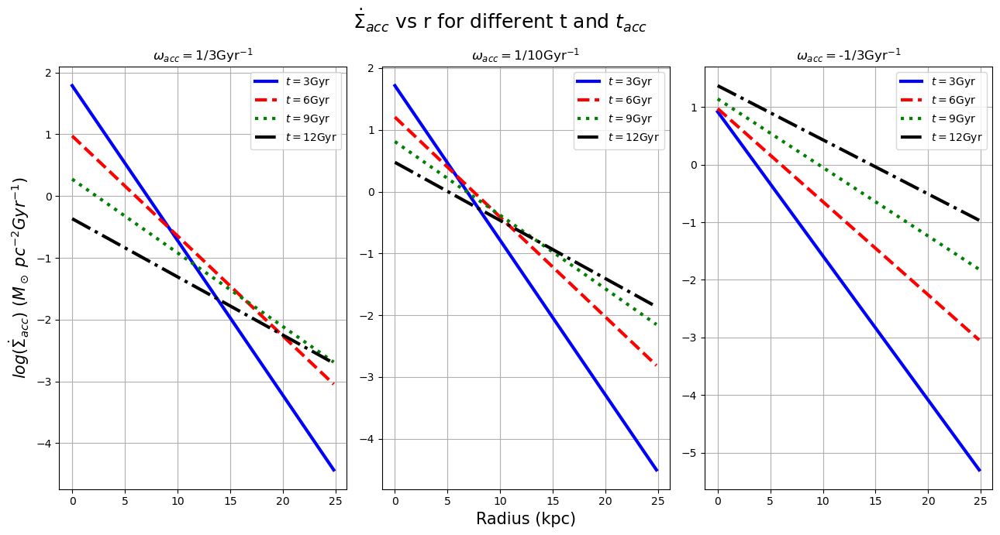

Execution time: 0.7108 seconds


In [24]:
M_sigma_accs = np.array([M_sigma_acc_dot1, M_sigma_acc_dot2, M_sigma_acc_dot3])

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\dot{\Sigma}_{acc}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\dot{\Sigma}_{acc})$ $(M_\odot\ pc^{-2} Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), M_sigma_accs, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/dotSigma_acc vs r (t_acc variation).png')

### $\tau_\mathrm{dep}$ and $\tau_\mathrm{sup}$

In [25]:
# Compute SFRs for cutoff_ksl without altering SFL: evaluate per-galaxy and per-radius elementwise
# Compute SFR surface density for cutoff_ksl in a vectorized way (handles array sigma)
def sfl_cutoff_array(sigma):
    Rf = 0.3
    sigma = np.asarray(sigma)
    low_reg = (1 - Rf) * 5.18e-4 * (sigma ** 3.83)
    high_reg = (1 - Rf) * 0.1625 * (sigma ** 1.4)
    with np.errstate(divide='ignore', invalid='ignore'):
        log_sigma = np.where(sigma > 0, np.log10(sigma), -np.inf)
    mask = log_sigma < 1.0
    return np.where(mask, low_reg, high_reg)

# define functions for supply and depletion timescales

def t_supply(Sigma_gas, r, t_acc, M_bar):
    """Returns the supply timescale, defined as the ratio of the gas surface density to the accretion rate surface density."""
    Sigma_acc = Sigma_acc_def(r, M_times1, t_acc, M_bar)
    t_supply_matrix = np.zeros(Sigma_gas.shape)
    for i in range(Sigma_gas.shape[0]): #loop over radius
        for j in range(Sigma_gas.shape[1]): #loop over time
            if Sigma_acc[i,j] > 0:
                t_supply_matrix[i,j] = Sigma_gas[i,j]/Sigma_acc[i,j]
            else:
                t_supply_matrix[i,j] = np.inf
    return t_supply_matrix

def t_depletion(Sigma_gas, r, t_acc, M_bar, sfl_type="cutoff_ksl"):
    """Returns the depletion timescale, defined as the ratio of the gas surface density to the star formation rate surface density."""
    if sfl_type == "cutoff_ksl":
        Sigma_sfr = sfl_cutoff_array(Sigma_gas)
    else:
        Sigma_sfr = SFL(Sigma_gas, sfl_type, r[:, np.newaxis], M_bar)
    t_depletion_matrix = np.zeros(Sigma_gas.shape)
    for i in range(Sigma_gas.shape[0]):
        for j in range(Sigma_gas.shape[1]):
            if Sigma_sfr[i,j] > 0:
                t_depletion_matrix[i,j] = Sigma_gas[i,j]/Sigma_sfr[i,j]
            else:
                t_depletion_matrix[i,j] = np.inf
    return t_depletion_matrix


Execution time: 0.0025 seconds


### $log(\Sigma_{gas})$ vs r for different t and $t_{acc}$

warnings.filterwarnings('ignore')

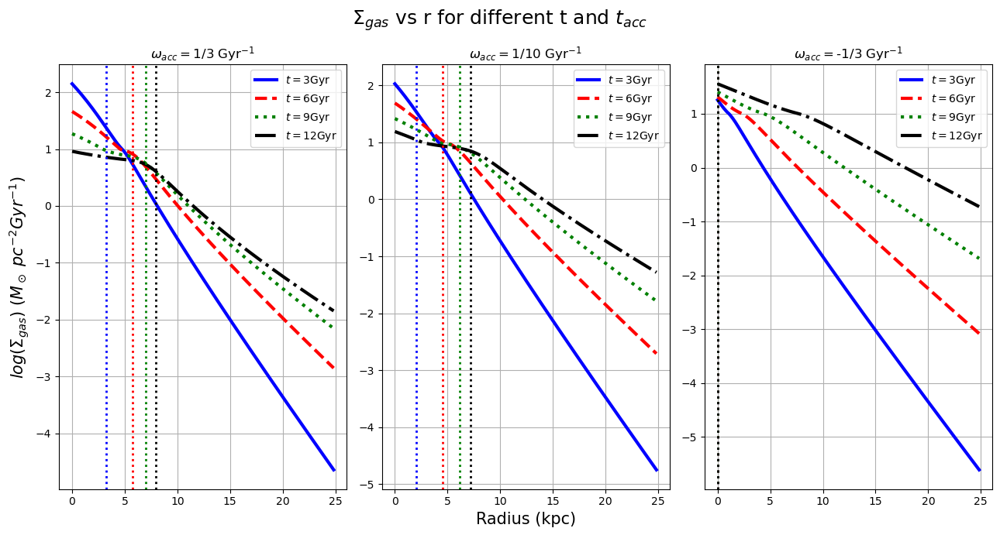

Execution time: 1.0763 seconds


In [26]:
Sigma_gas_cutoff_ksl = np.array([Sigma_gas_cutoff_ksl1, Sigma_gas_cutoff_ksl2, Sigma_gas_cutoff_ksl3])

#find radius where t_dep = t_sup for each t_acc and time
r_eq_list = []
for i, t_accr in enumerate(t_acc):
    t_sup = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")
    r_eq = np.zeros(t_sup.shape[1])
    for j in range(t_sup.shape[1]):
        diff = np.abs(t_sup[:,j] - t_dep[:,j])
        idx = np.argmin(diff)
        r_eq[j] = r[idx]
    r_eq_list.append(r_eq)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{gas}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2} Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_gas_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].axvline(x=r_eq_list[i][index_t1]/1000, color='blue', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t2]/1000, color='red', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t3]/1000, color='green', linestyle=':', lw=2)
    axes[i].axvline(x=r_eq_list[i][index_t4]/1000, color='black', linestyle=':', lw=2)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1, int(t_accr))} Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/Sigma_gas_cutoff_ksl vs r (t_acc variation).png')

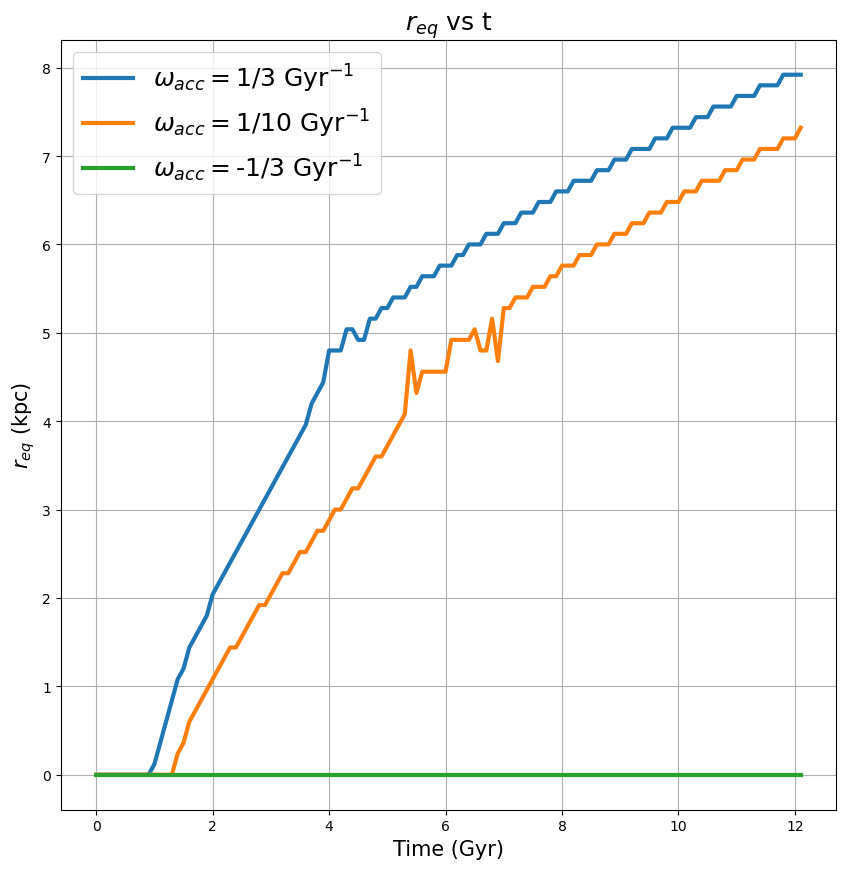

Execution time: 0.1783 seconds


In [27]:
# plot r_eq vs time for each t_acc
fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, r_eq, t_accr in zip(range(3), r_eq_list, t_acc):
    frame.plot(M_times1, r_eq/1000, label = r"$\omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", lw=3)
frame.set_title(r"$r_{eq}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$r_{eq}$ (kpc)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()

/tmp/ipykernel_1582953/565881254.py:7: RuntimeWarning: divide by zero encountered in log10
  frame.plot(r[:index_r1]/1000, np.log10(t_sup)[:index_r1,index_t4], label = r"$t_{sup}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)


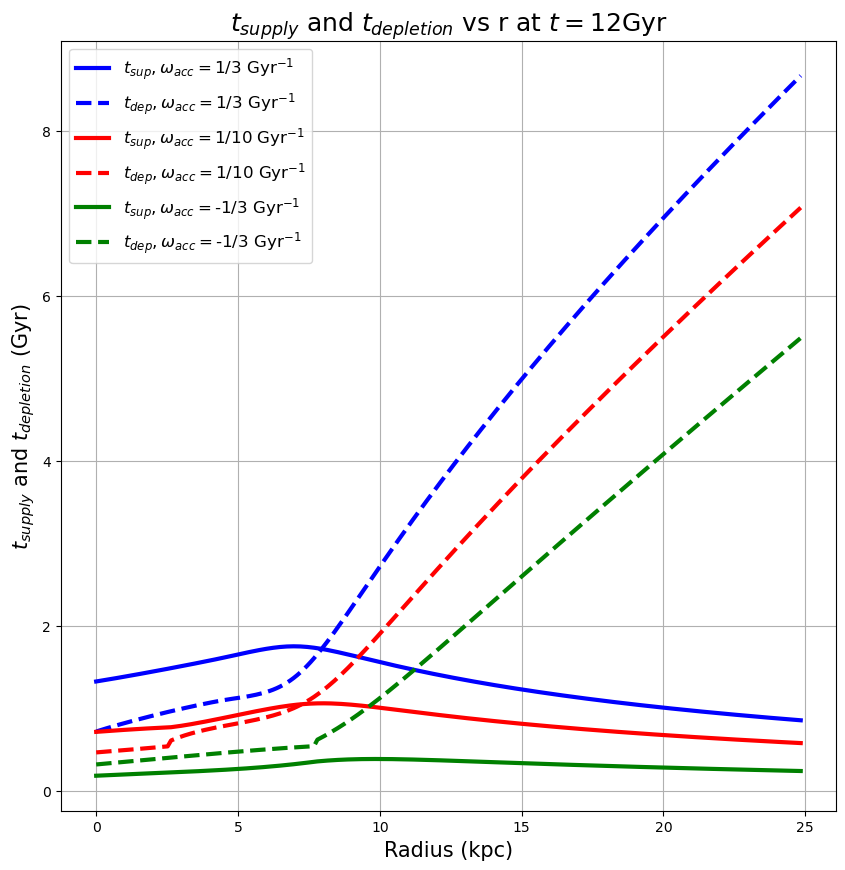

Execution time: 0.7119 seconds


In [28]:
# plot t_supply and t_depletion for cutoff_ksl at t=12Gyr for each t_acc
fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, t_accr, col, sty in zip(range(3), t_acc, colors, styles):
    t_sup = t_supply(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0)
    t_dep = t_depletion(Sigma_gas_cutoff_ksl[i], r, t_accr, M_bar_t0, sfl_type="cutoff_ksl")
    frame.plot(r[:index_r1]/1000, np.log10(t_sup)[:index_r1,index_t4], label = r"$t_{sup}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='solid', lw=3)
    frame.plot(r[:index_r1]/1000, np.log10(t_dep)[:index_r1,index_t4], label = r"$t_{dep}, \omega_{acc} = $"+f"{Fraction(1,int(t_accr))} Gyr$^{{-1}}$", color=col, linestyle='dashed', lw=3)
frame.set_title(r"$t_{supply}$ and $t_{depletion}$ vs r at $t=12$Gyr", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$t_{supply}$ and $t_{depletion}$ (Gyr)", fontsize = 15)
# frame.set_ylim(0.1, 100)
frame.legend(prop={'size': 12})
frame.grid()
show()

### $log(\Sigma_{SFR})$ vs r for different t and $t_{acc}$

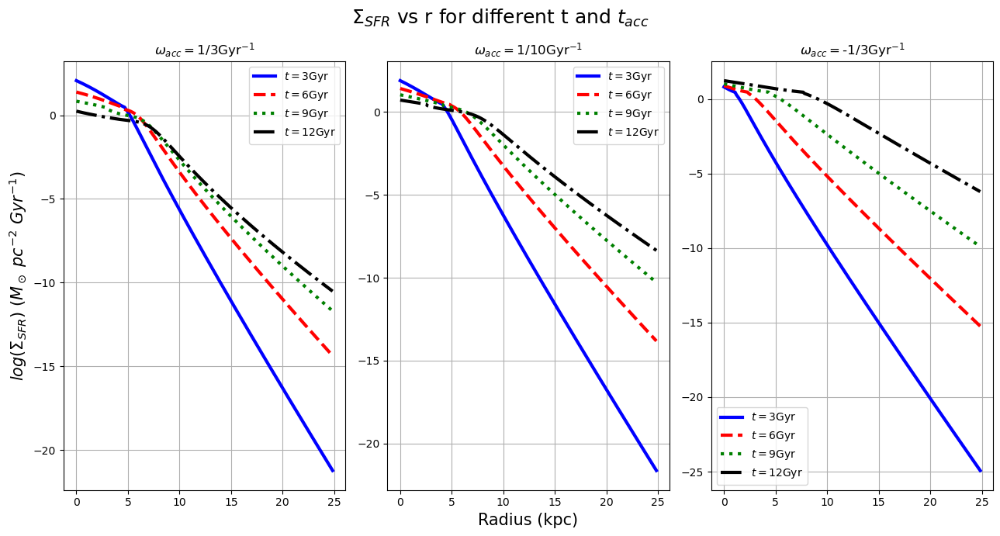

Execution time: 0.9382 seconds


In [29]:
M_sfrs_cutoff_ksl1 = sfl_cutoff_array(Sigma_gas_cutoff_ksl1)
M_sfrs_cutoff_ksl2 = sfl_cutoff_array(Sigma_gas_cutoff_ksl2)
M_sfrs_cutoff_ksl3 = sfl_cutoff_array(Sigma_gas_cutoff_ksl3)
M_sfrs_cutoff_ksl = np.array([M_sfrs_cutoff_ksl1, M_sfrs_cutoff_ksl2, M_sfrs_cutoff_ksl3])

np.savetxt('../data/data8_alternative_KSL/M_sfr1_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl1)
np.savetxt('../data/data8_alternative_KSL/M_sfr2_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl2)
np.savetxt('../data/data8_alternative_KSL/M_sfr3_cutoff_ksl_'+f'{np.log10(M_bar_t0)}.txt', M_sfrs_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7), facecolor='w')

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{SFR}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{SFR})$ $(M_\odot\ pc^{-2}\ Gyr^{-1})$", fontsize = 15)

for i, M, t_accr in zip(range(3), M_sfrs_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()

# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/Sigma_sfr vs r (t_acc variation).png')

### $log(\Sigma_{\star})$ vs r for different t and $t_{acc}$

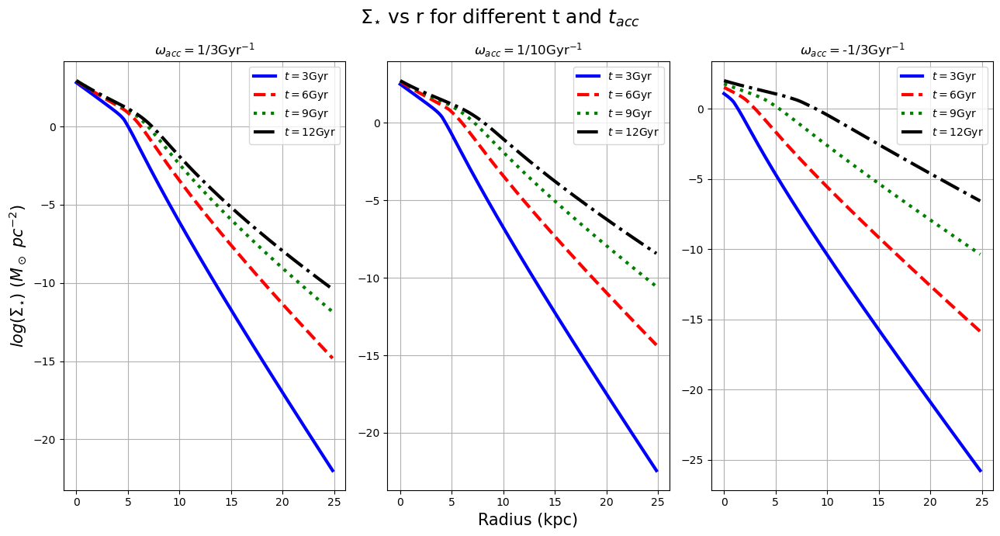

Execution time: 0.9473 seconds


In [30]:
# #if SFL_type == "old_ksl":
# Sigma_star_old_ksl1 = dt*np.cumsum(M_sfrs[0], axis=1)
# Sigma_star_old_ksl2 = dt*np.cumsum(M_sfrs[1], axis=1)
# Sigma_star_old_ksl3 = dt*np.cumsum(M_sfrs[2], axis=1)
# #elif SFL_type == "new_ksl":
# Sigma_star_new_ksl1 = dt*np.cumsum(M_sfrs_ksl[0], axis=1)
# Sigma_star_new_ksl2 = dt*np.cumsum(M_sfrs_ksl[1], axis=1)
# Sigma_star_new_ksl3 = dt*np.cumsum(M_sfrs_ksl[2], axis=1)
# #elif SFL_type == "boissier":
# Sigma_star_boissier1 = dt*np.cumsum(M_sfrs_boissier[0], axis=1)
# Sigma_star_boissier2 = dt*np.cumsum(M_sfrs_boissier[1], axis=1)
# Sigma_star_boissier3 = dt*np.cumsum(M_sfrs_boissier[2], axis=1)

# Sigma_stars_old_ksl = np.array([Sigma_star_old_ksl1, Sigma_star_old_ksl2, Sigma_star_old_ksl3])
# Sigma_stars_new_ksl = np.array([Sigma_star_new_ksl1, Sigma_star_new_ksl2, Sigma_star_new_ksl3])
# Sigma_stars_boissier = np.array([Sigma_star_boissier1, Sigma_star_boissier2, Sigma_star_boissier3])
# np.savetxt('../data7/M_star1_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_star_old_ksl1)
# np.savetxt('../data7/M_star2_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_star_old_ksl2)
# np.savetxt('../data7/M_star3_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_star_old_ksl3)

# np.savetxt(f'../data7/M_star1_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_star_new_ksl1)
# np.savetxt(f'../data7/M_star2_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_star_new_ksl2)
# np.savetxt(f'../data7/M_star3_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_star_new_ksl3)

# np.savetxt(f'../data7/M_star1_{np.log10(M_bar_t0)}_boissier.txt', Sigma_star_boissier1)
# np.savetxt(f'../data7/M_star2_{np.log10(M_bar_t0)}_boissier.txt', Sigma_star_boissier2)
# np.savetxt(f'../data7/M_star3_{np.log10(M_bar_t0)}_boissier.txt', Sigma_star_boissier3)

Sigma_star_cutoff_ksl1 = dt*np.cumsum(M_sfrs_cutoff_ksl[0], axis=1)
Sigma_star_cutoff_ksl2 = dt*np.cumsum(M_sfrs_cutoff_ksl[1], axis=1)
Sigma_star_cutoff_ksl3 = dt*np.cumsum(M_sfrs_cutoff_ksl[2], axis=1)
Sigma_stars_cutoff_ksl = np.array([Sigma_star_cutoff_ksl1, Sigma_star_cutoff_ksl2, Sigma_star_cutoff_ksl3])
np.savetxt(f'../data/data8_alternative_KSL/M_star1_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl1)
np.savetxt(f'../data/data8_alternative_KSL/M_star2_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl2)
np.savetxt(f'../data/data8_alternative_KSL/M_star3_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_star_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{\star}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_stars_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/Sigma_star vs r (t_acc variation).png')

### $log(\Sigma_{bar})$ vs r for different t and $t_{acc}$

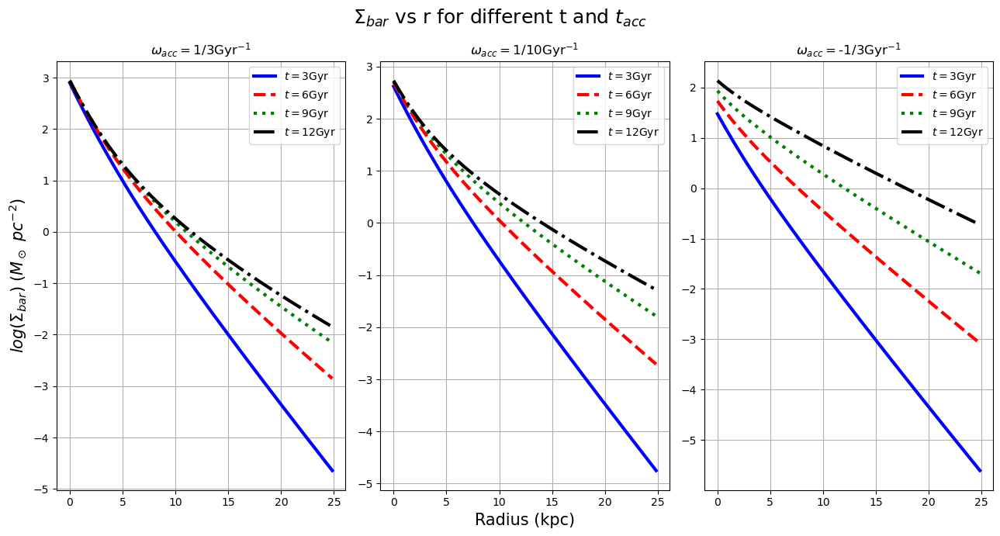

Execution time: 2.1649 seconds


In [31]:
# #if SFL_type == "old_ksl":
# Sigma_bar_old_ksl1 = np.array([np.sum(x) for x in zip(Sigma_gas_old_ksl1.ravel(), Sigma_star_old_ksl1.ravel())]).reshape(Sigma_gas_old_ksl1.shape)
# Sigma_bar_old_ksl2 = np.array([np.sum(x) for x in zip(Sigma_gas_old_ksl2.ravel(), Sigma_star_old_ksl2.ravel())]).reshape(Sigma_gas_old_ksl2.shape)
# Sigma_bar_old_ksl3 = np.array([np.sum(x) for x in zip(Sigma_gas_old_ksl3.ravel(), Sigma_star_old_ksl3.ravel())]).reshape(Sigma_gas_old_ksl3.shape)
# #elif SFL_type == "new_ksl":
# Sigma_bar_new_ksl1 = np.array([np.sum(x) for x in zip(Sigma_gas_new_ksl1.ravel(), Sigma_star_new_ksl1.ravel())]).reshape(Sigma_gas_new_ksl1.shape)
# Sigma_bar_new_ksl2 = np.array([np.sum(x) for x in zip(Sigma_gas_new_ksl2.ravel(), Sigma_star_new_ksl2.ravel())]).reshape(Sigma_gas_new_ksl2.shape)
# Sigma_bar_new_ksl3 = np.array([np.sum(x) for x in zip(Sigma_gas_new_ksl3.ravel(), Sigma_star_new_ksl3.ravel())]).reshape(Sigma_gas_new_ksl3.shape)
# #elif SFL_type == "boissier":
# Sigma_bar_boissier1 = np.array([np.sum(x) for x in zip(Sigma_gas_boissier1.ravel(), Sigma_star_boissier1.ravel())]).reshape(Sigma_gas_boissier1.shape)
# Sigma_bar_boissier2 = np.array([np.sum(x) for x in zip(Sigma_gas_boissier2.ravel(), Sigma_star_boissier2.ravel())]).reshape(Sigma_gas_boissier2.shape)
# Sigma_bar_boissier3 = np.array([np.sum(x) for x in zip(Sigma_gas_boissier3.ravel(), Sigma_star_boissier3.ravel())]).reshape(Sigma_gas_boissier3.shape)

# Sigma_bars_old_ksl = np.array([Sigma_bar_old_ksl1, Sigma_bar_old_ksl2, Sigma_bar_old_ksl3])
# Sigma_bars_new_ksl = np.array([Sigma_bar_new_ksl1, Sigma_bar_new_ksl2, Sigma_bar_new_ksl3])
# Sigma_bars_boissier = np.array([Sigma_bar_boissier1, Sigma_bar_boissier2, Sigma_bar_boissier3])

# np.savetxt(f'../data/data7/M_bar1_{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_bar_old_ksl1)
# np.savetxt(f'../data/data7/M_bar2_{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_bar_old_ksl2)
# np.savetxt(f'../data/data7/M_bar3_{np.log10(M_bar_t0)}_old_ksl.txt', Sigma_bar_old_ksl3)

# np.savetxt(f'../data/data7/M_bar1_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_bar_new_ksl1)
# np.savetxt(f'../data/data7/M_bar2_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_bar_new_ksl2)
# np.savetxt(f'../data/data7/M_bar3_{np.log10(M_bar_t0)}_new_ksl.txt', Sigma_bar_new_ksl3)

# np.savetxt(f'../data/data7/M_bar1_{np.log10(M_bar_t0)}_boissier.txt', Sigma_bar_boissier1)
# np.savetxt(f'../data/data7/M_bar2_{np.log10(M_bar_t0)}_boissier.txt', Sigma_bar_boissier2)
# np.savetxt(f'../data/data7/M_bar3_{np.log10(M_bar_t0)}_boissier.txt', Sigma_bar_boissier3)

Sigma_bar_cutoff_ksl1 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl1.ravel(), Sigma_star_cutoff_ksl1.ravel())]).reshape(Sigma_gas_cutoff_ksl1.shape)
Sigma_bar_cutoff_ksl2 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl2.ravel(), Sigma_star_cutoff_ksl2.ravel())]).reshape(Sigma_gas_cutoff_ksl2.shape)
Sigma_bar_cutoff_ksl3 = np.array([np.sum(x) for x in zip(Sigma_gas_cutoff_ksl3.ravel(), Sigma_star_cutoff_ksl3.ravel())]).reshape(Sigma_gas_cutoff_ksl3.shape)
Sigma_bars_cutoff_ksl = np.array([Sigma_bar_cutoff_ksl1, Sigma_bar_cutoff_ksl2, Sigma_bar_cutoff_ksl3])
np.savetxt(f'../data/data8_alternative_KSL/M_bar1_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl1)
np.savetxt(f'../data/data8_alternative_KSL/M_bar2_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl2)
np.savetxt(f'../data/data8_alternative_KSL/M_bar3_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Sigma_bar_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$\Sigma_{bar}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$log(\Sigma_{bar})$ $(M_\odot\ pc^{-2})$", fontsize = 15)

for i, M, t_accr in zip(range(3), Sigma_bars_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t1])[:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t2])[:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t3])[:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, np.log10(M[:,index_t4])[:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1,int(t_accr))}Gyr"+r'$^{-1}$')
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/Sigma_bar vs r (t_acc variation).png')

In [32]:
NGC3198_HI = pd.read_table("../data/allHIprofs/NGC3198_fullHI.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_HI[Msun/pc2]", "jHI[kpckm/s]"])
NGC3198_star = pd.read_table("../data/allSTARSprofs/NGC3198_fullstars_2.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_star[Msun/pc2]", "jstar[kpckm/s]"])

NGC3198_HI['r[kpc]'] =  pd.to_numeric(NGC3198_HI['r[kpc]'], errors='coerce')
NGC3198_HI['vrot[km/s]'] =  pd.to_numeric(NGC3198_HI['vrot[km/s]'], errors='coerce')
NGC3198_HI['Sigma_HI[Msun/pc2]'] =  pd.to_numeric(NGC3198_HI['Sigma_HI[Msun/pc2]'], errors='coerce')
NGC3198_HI['jHI[kpckm/s]'] =  pd.to_numeric(NGC3198_HI['jHI[kpckm/s]'], errors='coerce')

NGC3198_star['r[kpc]'] =  pd.to_numeric(NGC3198_star['r[kpc]'], errors='coerce')
NGC3198_star['vrot[km/s]'] =  pd.to_numeric(NGC3198_star['vrot[km/s]'], errors='coerce')
NGC3198_star['Sigma_star[Msun/pc2]'] =  pd.to_numeric(NGC3198_star['Sigma_star[Msun/pc2]'], errors='coerce')
NGC3198_star['jstar[kpckm/s]'] =  pd.to_numeric(NGC3198_star['jstar[kpckm/s]'], errors='coerce')

NGC3198_r_obs_HI = NGC3198_HI['r[kpc]']
NGC3198_r_obs_star = NGC3198_star['r[kpc]']
NGC3198_v_obs = NGC3198_HI['vrot[km/s]']
NGC3198_Sigma_gas_obs = 1.33*NGC3198_HI['Sigma_HI[Msun/pc2]']
NGC3198_Sigma_star_obs = NGC3198_star['Sigma_star[Msun/pc2]']

NGC2403_HI = pd.read_table("../data/allHIprofs/NGC2403_fullHI.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_HI[Msun/pc2]", "jHI[kpckm/s]"])
NGC2403_star = pd.read_table("../data/allSTARSprofs/NGC2403_fullstars.dat", sep=" ", usecols=["r[kpc]", "vrot[km/s]", "Sigma_star[Msun/pc2]", "jstar[kpckm/s]"])

NGC2403_HI['r[kpc]'] = pd.to_numeric(NGC2403_HI['r[kpc]'], errors='coerce')
NGC2403_HI['vrot[km/s]'] = pd.to_numeric(NGC2403_HI['vrot[km/s]'], errors='coerce')
NGC2403_HI['Sigma_HI[Msun/pc2]'] = pd.to_numeric(NGC2403_HI['Sigma_HI[Msun/pc2]'], errors='coerce')
NGC2403_HI['jHI[kpckm/s]'] = pd.to_numeric(NGC2403_HI['jHI[kpckm/s]'], errors='coerce')

NGC2403_star['r[kpc]'] = pd.to_numeric(NGC2403_star['r[kpc]'], errors='coerce')
NGC2403_star['vrot[km/s]'] = pd.to_numeric(NGC2403_star['vrot[km/s]'], errors='coerce')
NGC2403_star['Sigma_star[Msun/pc2]'] = pd.to_numeric(NGC2403_star['Sigma_star[Msun/pc2]'], errors='coerce')
NGC2403_star['jstar[kpckm/s]'] = pd.to_numeric(NGC2403_star['jstar[kpckm/s]'], errors='coerce')

NGC2403_r_obs_HI = NGC2403_HI['r[kpc]']
NGC2403_r_obs_star = NGC2403_star['r[kpc]']
NGC2403_v_obs = NGC2403_HI['vrot[km/s]']
NGC2403_Sigma_gas_obs = 1.33 * NGC2403_HI['Sigma_HI[Msun/pc2]']
NGC2403_Sigma_star_obs = NGC2403_star['Sigma_star[Msun/pc2]']

Execution time: 0.0666 seconds


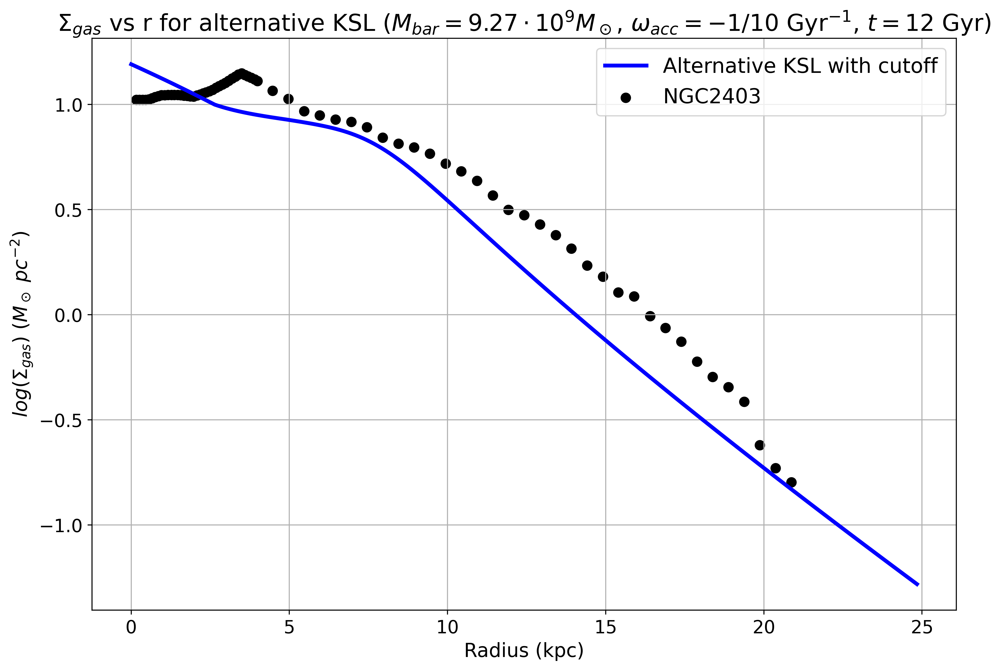

Execution time: 0.7809 seconds


In [33]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_gas_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_HI, np.log10(NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{gas}$ vs r for alternative KSL ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_gas_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_HI, np.log10(NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{gas}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{gas})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

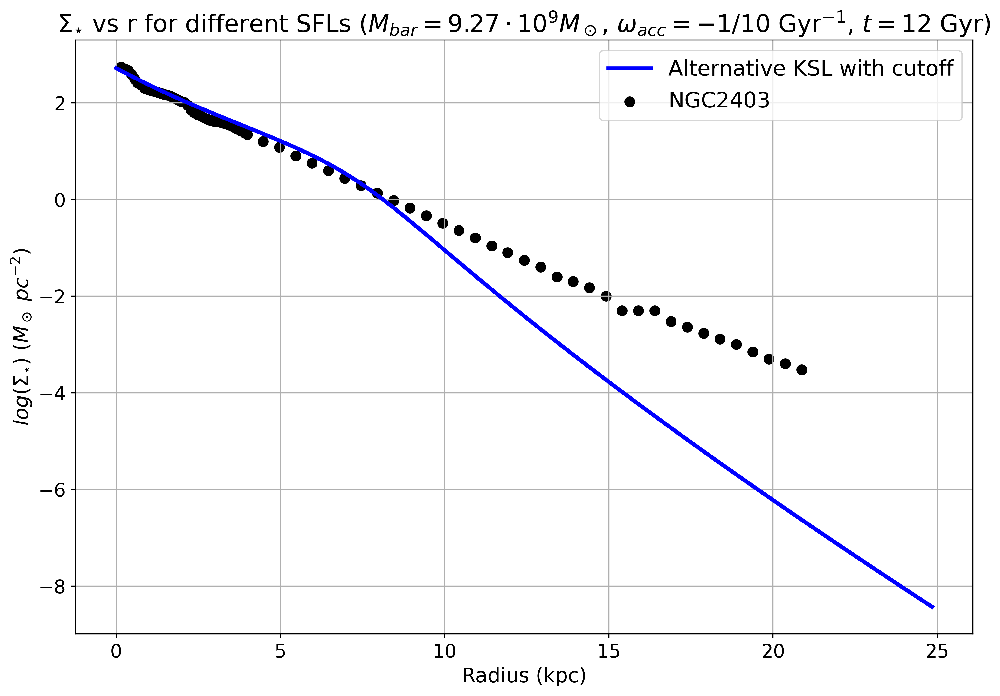

Execution time: 0.7543 seconds


In [34]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_stars_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_star, np.log10(NGC2403_Sigma_star_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{\star}$ vs r for different SFLs ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

middle_sigmas_star = np.array([Sigma_stars_old_ksl[1], Sigma_stars_new_ksl[1], Sigma_stars_boissier[1]])

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, M1, sfl, col, sty in zip(range(3), middle_sigmas_star, SFLS, colors, styles):
    frame.plot(r[:index_r2]/1000, np.log10(M1[:index_r2,index_t4]), label=sfl, linestyle=sty, color=col, lw=3)
frame.scatter(NGC3198_r_obs_star, np.log10(NGC3198_Sigma_star_obs), label=r"NGC3198", c='k', s=50)
frame.set_title(r"$\Sigma_{\star}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\star})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

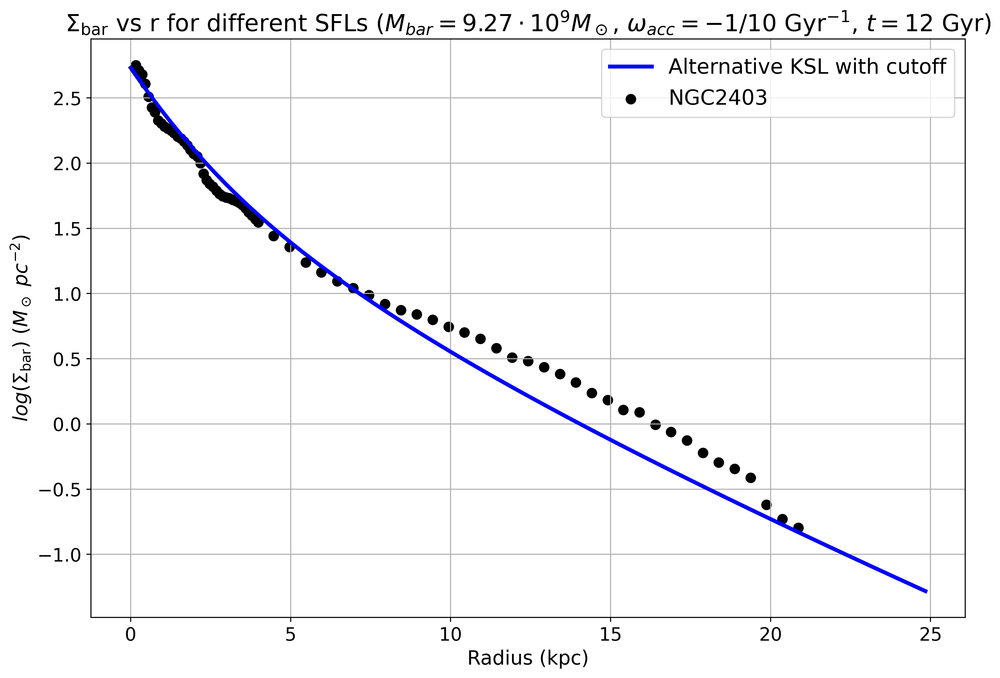

Execution time: 0.7865 seconds


In [35]:
fig = figure(figsize=(12, 8), dpi=400, facecolor='w', edgecolor='k')
frame = fig.add_subplot(1,1,1)
frame.plot(r[:index_r1]/1000, np.log10(Sigma_bars_cutoff_ksl[1][:index_r1,index_t4]), label=r"Alternative KSL with cutoff", color="blue", lw=3)
frame.scatter(NGC2403_r_obs_star, np.log10(NGC2403_Sigma_star_obs+NGC2403_Sigma_gas_obs), label=r"NGC2403", c='k', s=50)
frame.set_title(r"$\Sigma_{\mathrm{bar}}$ vs r for different SFLs ($M_{bar}=9.27\cdot10^{9}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\mathrm{bar}})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

middle_sigmas_bar = np.array([Sigma_bars_old_ksl[1], Sigma_bars_new_ksl[1], Sigma_bars_boissier[1]])

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, M1, sfl, col, sty in zip(range(3), middle_sigmas_bar, SFLS, colors, styles):
    frame.plot(r[:index_r2]/1000, np.log10(M1[:index_r2,index_t4]), label=sfl, linestyle=sty, color=col, lw=3)
frame.scatter(NGC3198_r_obs_star, np.log10(NGC3198_Sigma_star_obs+NGC3198_Sigma_gas_obs), label=r"NGC3198", c='k', s=50)
frame.set_title(r"$\Sigma_{\mathrm{bar}}$ vs r for different SFLs ($M_{bar}=3.14\cdot10^{10}M_\odot$, $\omega_{acc} = -1/10$ Gyr$^{-1}$, $t=12$ Gyr)", fontsize = 18)
frame.set_xlabel("Radius (kpc)", fontsize = 15)
frame.set_ylabel(r"$log(\Sigma_{\mathrm{bar}})$ $(M_\odot\ pc^{-2})$", fontsize = 15)
frame.tick_params(labelsize=14)
frame.legend(prop={'size': 16})
frame.grid()
show()

warnings.filterwarnings('default')

## $f_{gas}$ vs r

/tmp/ipykernel_1582953/3272886515.py:30: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl1 = np.divide(Sigma_gas_cutoff_ksl1, Sigma_bar_cutoff_ksl1)
/tmp/ipykernel_1582953/3272886515.py:31: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl2 = np.divide(Sigma_gas_cutoff_ksl2, Sigma_bar_cutoff_ksl2)
/tmp/ipykernel_1582953/3272886515.py:32: RuntimeWarning: invalid value encountered in divide
  f_gas_cutoff_ksl3 = np.divide(Sigma_gas_cutoff_ksl3, Sigma_bar_cutoff_ksl3)


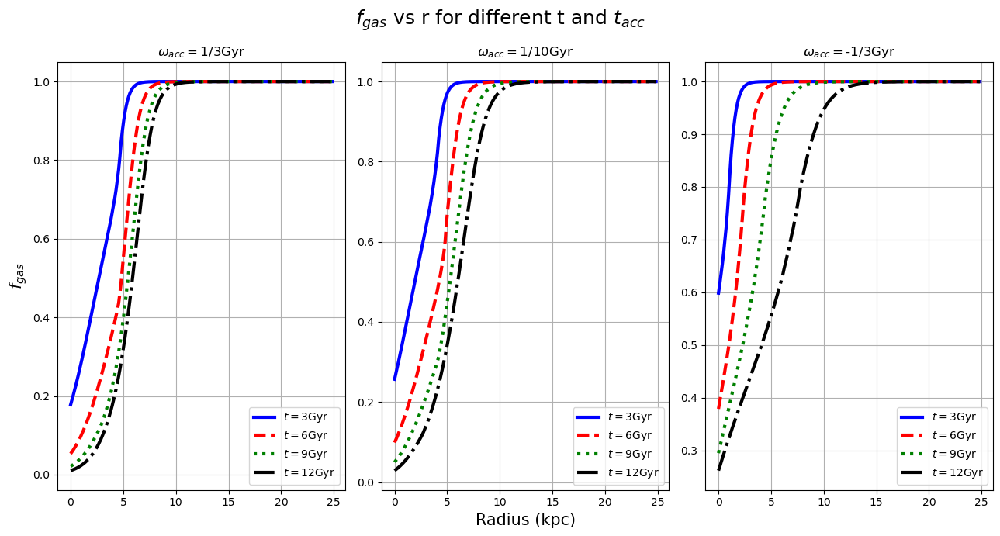

Execution time: 0.8143 seconds


In [36]:
# #if SFL_type == "old_ksl":
# f_gas_old_ksl1 = np.divide(Sigma_gas_old_ksl1, Sigma_bar_old_ksl1)
# f_gas_old_ksl2 = np.divide(Sigma_gas_old_ksl2, Sigma_bar_old_ksl2)
# f_gas_old_ksl3 = np.divide(Sigma_gas_old_ksl3, Sigma_bar_old_ksl3)
# #elif SFL_type == "new_ksl":
# f_gas_new_ksl1 = np.divide(Sigma_gas_new_ksl1, Sigma_bar_new_ksl1)
# f_gas_new_ksl2 = np.divide(Sigma_gas_new_ksl2, Sigma_bar_new_ksl2)
# f_gas_new_ksl3 = np.divide(Sigma_gas_new_ksl3, Sigma_bar_new_ksl3)
# #elif SFL_type == "boissier":
# f_gas_boissier1 = np.divide(Sigma_gas_boissier1, Sigma_bar_boissier1)
# f_gas_boissier2 = np.divide(Sigma_gas_boissier2, Sigma_bar_boissier2)
# f_gas_boissier3 = np.divide(Sigma_gas_boissier3, Sigma_bar_boissier3)

# f_gass_old_ksl = np.array([f_gas_old_ksl1, f_gas_old_ksl2, f_gas_old_ksl3])
# f_gass_new_ksl = np.array([f_gas_new_ksl1, f_gas_new_ksl2, f_gas_new_ksl3])
# f_gass_boissier = np.array([f_gas_boissier1, f_gas_boissier2, f_gas_boissier3])

# np.savetxt(f'../data/data7/f_gas1_radial_{np.log10(M_bar_t0)}_old_ksl.txt', f_gas_old_ksl1)
# np.savetxt(f'../data/data7/f_gas2_radial_{np.log10(M_bar_t0)}_old_ksl.txt', f_gas_old_ksl2)
# np.savetxt(f'../data/data7/f_gas3_radial_{np.log10(M_bar_t0)}_old_ksl.txt', f_gas_old_ksl3)

# np.savetxt(f'../data/data7/f_gas1_radial_{np.log10(M_bar_t0)}_new_ksl.txt', f_gas_new_ksl1)
# np.savetxt(f'../data/data7/f_gas2_radial_{np.log10(M_bar_t0)}_new_ksl.txt', f_gas_new_ksl2)
# np.savetxt(f'../data/data7/f_gas3_radial_{np.log10(M_bar_t0)}_new_ksl.txt', f_gas_new_ksl3)

# np.savetxt(f'../data/data7/f_gas1_radial_{np.log10(M_bar_t0)}_boissier.txt', f_gas_boissier1)
# np.savetxt(f'../data/data7/f_gas2_radial_{np.log10(M_bar_t0)}_boissier.txt', f_gas_boissier2)
# np.savetxt(f'../data/data7/f_gas3_radial_{np.log10(M_bar_t0)}_boissier.txt', f_gas_boissier3)

f_gas_cutoff_ksl1 = np.divide(Sigma_gas_cutoff_ksl1, Sigma_bar_cutoff_ksl1)
f_gas_cutoff_ksl2 = np.divide(Sigma_gas_cutoff_ksl2, Sigma_bar_cutoff_ksl2)
f_gas_cutoff_ksl3 = np.divide(Sigma_gas_cutoff_ksl3, Sigma_bar_cutoff_ksl3)
f_gas_cutoff_ksl = np.array([f_gas_cutoff_ksl1, f_gas_cutoff_ksl2, f_gas_cutoff_ksl3])
np.savetxt(f'../data/data8_alternative_KSL/f_gas1_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl1)
np.savetxt(f'../data/data8_alternative_KSL/f_gas2_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl2)
np.savetxt(f'../data/data8_alternative_KSL/f_gas3_radial_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_gas_cutoff_ksl3)

# Create a figure with three subplots
fig, axes = plt.subplots(nrows=1, ncols=3, sharex=True, sharey="col", figsize=(13, 7))

# Set the labels and titles of the subplots
f1 = axes[0]
f2 = axes[1]
f3 = axes[2]
fig.suptitle(r"$f_{gas}$ vs r for different t and $t_{acc}$", fontsize = 18)
f2.set_xlabel("Radius (kpc)", fontsize = 15)
f1.set_ylabel(r"$f_{gas}$", fontsize = 15)

for i, f_gas, t_accr in zip(range(3), f_gas_cutoff_ksl, t_acc):
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t1][:index_r1], label=r"$t = 3$Gyr", color="blue", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t2][:index_r1], label=r"$t = 6$Gyr", linestyle="dashed", color="red", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t3][:index_r1], label=r"$t = 9$Gyr", linestyle="dotted", color="green", lw=3)
    axes[i].plot(r[:index_r1]/1000, f_gas[:,index_t4][:index_r1], label=r"$t = 12$Gyr", linestyle="dashdot", color="black", lw=3)
    axes[i].set_title(r"$\omega_{acc}=$"+f"{Fraction(1, int(t_accr))}Gyr")
    axes[i].legend()
    
# Add grid lines to each subplot and adjust layout
for ax in axes:
    ax.grid(True)

plt.tight_layout()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/f_gas vs r (t_acc variation).png')

## $M_{gas}$ vs t

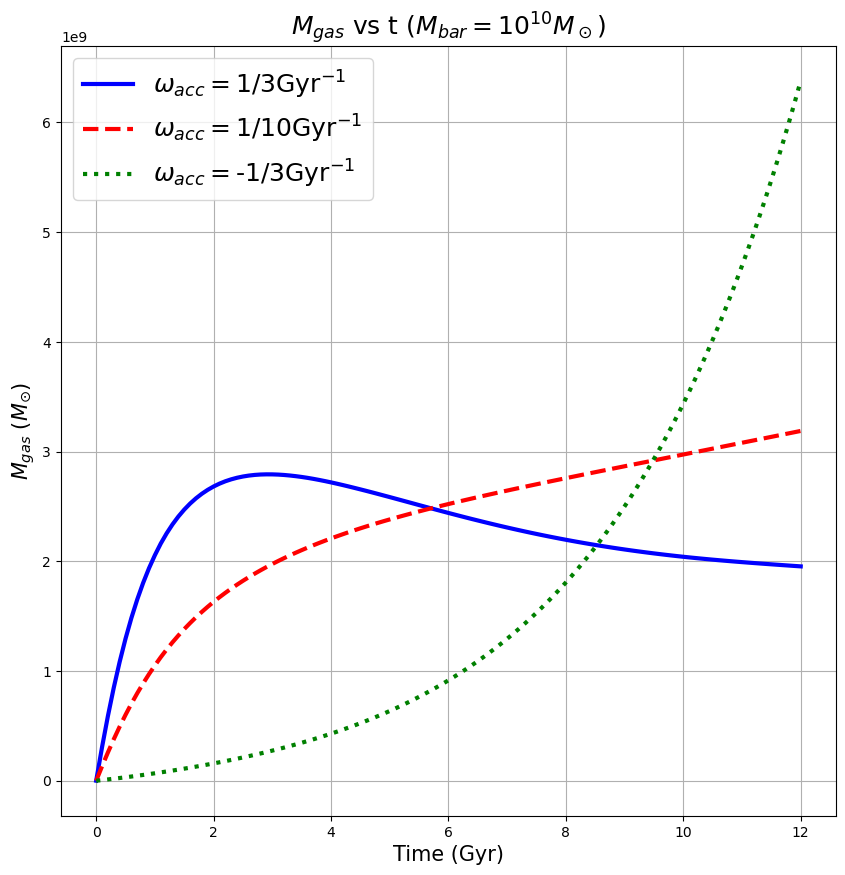

Execution time: 0.3783 seconds


In [37]:
dr = 120
integral_r = r.reshape(835,1)

# #if SFL_type == "old_ksl":
# Mass_gas_summed_old_ksl1 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_old_ksl1, dx=dr, axis=0)
# Mass_gas_summed_old_ksl2 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_old_ksl2, dx=dr, axis=0)
# Mass_gas_summed_old_ksl3 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_old_ksl3, dx=dr, axis=0)
# #elif SFL_type == "new_ksl":
# Mass_gas_summed_new_ksl1 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_new_ksl1, dx=dr, axis=0)
# Mass_gas_summed_new_ksl2 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_new_ksl2, dx=dr, axis=0)
# Mass_gas_summed_new_ksl3 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_new_ksl3, dx=dr, axis=0)
# #elif SFL_type == "boissier":
# Mass_gas_summed_boissier1 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_boissier1, dx=dr, axis=0)
# Mass_gas_summed_boissier2 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_boissier2, dx=dr, axis=0)
# Mass_gas_summed_boissier3 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_boissier3, dx=dr, axis=0)

# np.savetxt(f'../data/data7/Mass_gas1_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_gas_summed_old_ksl1)
# np.savetxt(f'../data/data7/Mass_gas2_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_gas_summed_old_ksl2)
# np.savetxt(f'../data/data7/Mass_gas3_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_gas_summed_old_ksl3)

# np.savetxt(f'../data/data7/Mass_gas1_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_gas_summed_new_ksl1)
# np.savetxt(f'../data/data7/Mass_gas2_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_gas_summed_new_ksl2)
# np.savetxt(f'../data/data7/Mass_gas3_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_gas_summed_new_ksl3)

# np.savetxt(f'../data/data7/Mass_gas1_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_gas_summed_boissier1)
# np.savetxt(f'../data/data7/Mass_gas2_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_gas_summed_boissier2)
# np.savetxt(f'../data/data7/Mass_gas3_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_gas_summed_boissier3)

Mass_gas_summed_cutoff_ksl1 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl1, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl2 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl2, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl3 = 2*np.pi*spint.simpson(integral_r*Sigma_gas_cutoff_ksl3, dx=dr, axis=0)
Mass_gas_summed_cutoff_ksl = np.array([Mass_gas_summed_cutoff_ksl1, Mass_gas_summed_cutoff_ksl2, Mass_gas_summed_cutoff_ksl3])
np.savetxt(f'../data/data8_alternative_KSL/Mass_gas1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl1)
np.savetxt(f'../data/data8_alternative_KSL/Mass_gas2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl2)
np.savetxt(f'../data/data8_alternative_KSL/Mass_gas3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_gas_summed_cutoff_ksl3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(M_times1[:-1], Mass_gas_summed_old_ksl1[:-1], label=fr"Standard KSL", color="blue", lw=3)
# frame.plot(M_times1[:-1], Mass_gas_summed_new_ksl1[:-1], label=fr"New Fitted KSL", linestyle="dashed", color="red", lw=3)
# frame.plot(M_times1[:-1], Mass_gas_summed_boissier1[:-1], label=fr"Boissier SFL", linestyle="dotted", color="green", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_gas_summed_cutoff_ksl3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{gas}}$ vs t ($M_{{bar}}=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{gas}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/M_gas vs time (SFL variation).png')

## $M_{\star}$ vs t

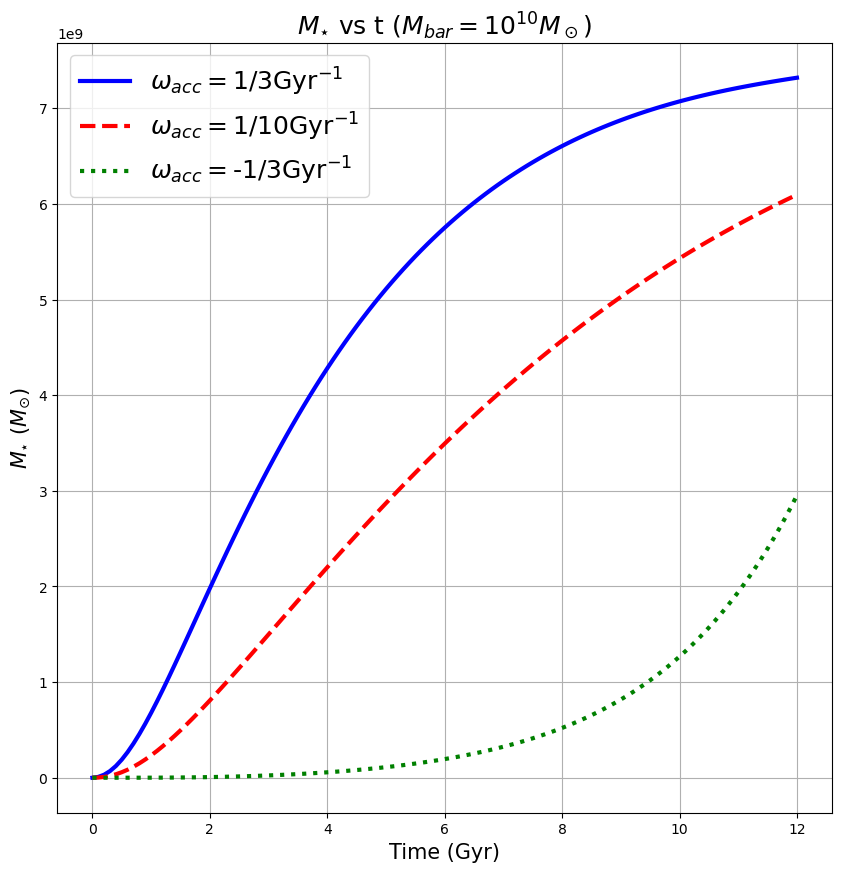

Execution time: 0.3201 seconds


In [38]:
# #if SFL_type == "old_ksl":
# Mass_sfr_summed_old_ksl1 = 2*np.pi*spint.simpson(integral_r*M_sfrs[0], dx=dr, axis=0)
# Mass_sfr_summed_old_ksl2 = 2*np.pi*spint.simpson(integral_r*M_sfrs[1], dx=dr, axis=0)
# Mass_sfr_summed_old_ksl3 = 2*np.pi*spint.simpson(integral_r*M_sfrs[2], dx=dr, axis=0)
# #elif SFL_type == "new_ksl":
# Mass_sfr_summed_new_ksl1 = 2*np.pi*spint.simpson(integral_r*M_sfrs_ksl[0], dx=dr, axis=0)
# Mass_sfr_summed_new_ksl2 = 2*np.pi*spint.simpson(integral_r*M_sfrs_ksl[1], dx=dr, axis=0)
# Mass_sfr_summed_new_ksl3 = 2*np.pi*spint.simpson(integral_r*M_sfrs_ksl[2], dx=dr, axis=0)
# #elif SFL_type == "boissier":
# Mass_sfr_summed_boissier1 = 2*np.pi*spint.simpson(integral_r*M_sfrs_boissier[0], dx=dr, axis=0)
# Mass_sfr_summed_boissier2 = 2*np.pi*spint.simpson(integral_r*M_sfrs_boissier[1], dx=dr, axis=0)
# Mass_sfr_summed_boissier3 = 2*np.pi*spint.simpson(integral_r*M_sfrs_boissier[2], dx=dr, axis=0)

# np.savetxt(f'../data/data7/Mass_SFR1_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_sfr_summed_old_ksl1)
# np.savetxt(f'../data/data7/Mass_SFR2_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_sfr_summed_old_ksl2)
# np.savetxt(f'../data/data7/Mass_SFR3_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_sfr_summed_old_ksl3)

# np.savetxt(f'../data/data7/Mass_SFR1_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_sfr_summed_new_ksl1)
# np.savetxt(f'../data/data7/Mass_SFR2_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_sfr_summed_new_ksl2)
# np.savetxt(f'../data/data7/Mass_SFR3_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_sfr_summed_new_ksl3)

# np.savetxt(f'../data/data7/Mass_SFR1_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_sfr_summed_boissier1)
# np.savetxt(f'../data/data7/Mass_SFR2_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_sfr_summed_boissier2)
# np.savetxt(f'../data/data7/Mass_SFR3_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_sfr_summed_boissier3)

# Mass_time_star_old_ksl_1 = dt*np.cumsum(Mass_sfr_summed_old_ksl1)
# Mass_time_star_old_ksl_2 = dt*np.cumsum(Mass_sfr_summed_old_ksl2)
# Mass_time_star_old_ksl_3 = dt*np.cumsum(Mass_sfr_summed_old_ksl3)

# Mass_time_star_new_ksl_1 = dt*np.cumsum(Mass_sfr_summed_new_ksl1)
# Mass_time_star_new_ksl_2 = dt*np.cumsum(Mass_sfr_summed_new_ksl2)
# Mass_time_star_new_ksl_3 = dt*np.cumsum(Mass_sfr_summed_new_ksl3)

# Mass_time_star_boissier_1 = dt*np.cumsum(Mass_sfr_summed_boissier1)
# Mass_time_star_boissier_2 = dt*np.cumsum(Mass_sfr_summed_boissier2)
# Mass_time_star_boissier_3 = dt*np.cumsum(Mass_sfr_summed_boissier3)

# np.savetxt(f'../data/data7/Mass_star1_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_time_star_old_ksl_1)
# np.savetxt(f'../data/data7/Mass_star2_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_time_star_old_ksl_2)
# np.savetxt(f'../data/data7/Mass_star3_vs_t_{np.log10(M_bar_t0)}_old_ksl.txt', Mass_time_star_old_ksl_3)

# np.savetxt(f'../data/data7/Mass_star1_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_time_star_new_ksl_1)
# np.savetxt(f'../data/data7/Mass_star2_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_time_star_new_ksl_2)
# np.savetxt(f'../data/data7/Mass_star3_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', Mass_time_star_new_ksl_3)

# np.savetxt(f'../data/data7/Mass_star1_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_time_star_boissier_1)
# np.savetxt(f'../data/data7/Mass_star2_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_time_star_boissier_2)
# np.savetxt(f'../data/data7/Mass_star3_vs_t_{np.log10(M_bar_t0)}_boissier.txt', Mass_time_star_boissier_3)

Mass_sfr_summed_cutoff_ksl1 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[0], dx=dr, axis=0)
Mass_sfr_summed_cutoff_ksl2 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[1], dx=dr, axis=0)
Mass_sfr_summed_cutoff_ksl3 = 2*np.pi*spint.simpson(integral_r*M_sfrs_cutoff_ksl[2], dx=dr, axis=0)
Mass_time_star_cutoff_ksl_1 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl1)
Mass_time_star_cutoff_ksl_2 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl2)
Mass_time_star_cutoff_ksl_3 = dt*np.cumsum(Mass_sfr_summed_cutoff_ksl3)

np.savetxt(f'../data/data8_alternative_KSL/Mass_SFR1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl1)
np.savetxt(f'../data/data8_alternative_KSL/Mass_SFR2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl2)
np.savetxt(f'../data/data8_alternative_KSL/Mass_SFR3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_sfr_summed_cutoff_ksl3)
np.savetxt(f'../data/data8_alternative_KSL/Mass_star1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_1)
np.savetxt(f'../data/data8_alternative_KSL/Mass_star2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_2)
np.savetxt(f'../data/data8_alternative_KSL/Mass_star3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_star_cutoff_ksl_3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_time_star_cutoff_ksl_3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{\star}}$ vs t ($M_{{bar}}=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{\star}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/M_star vs time (SFL variation).png')

## $M_{bar}$ vs t

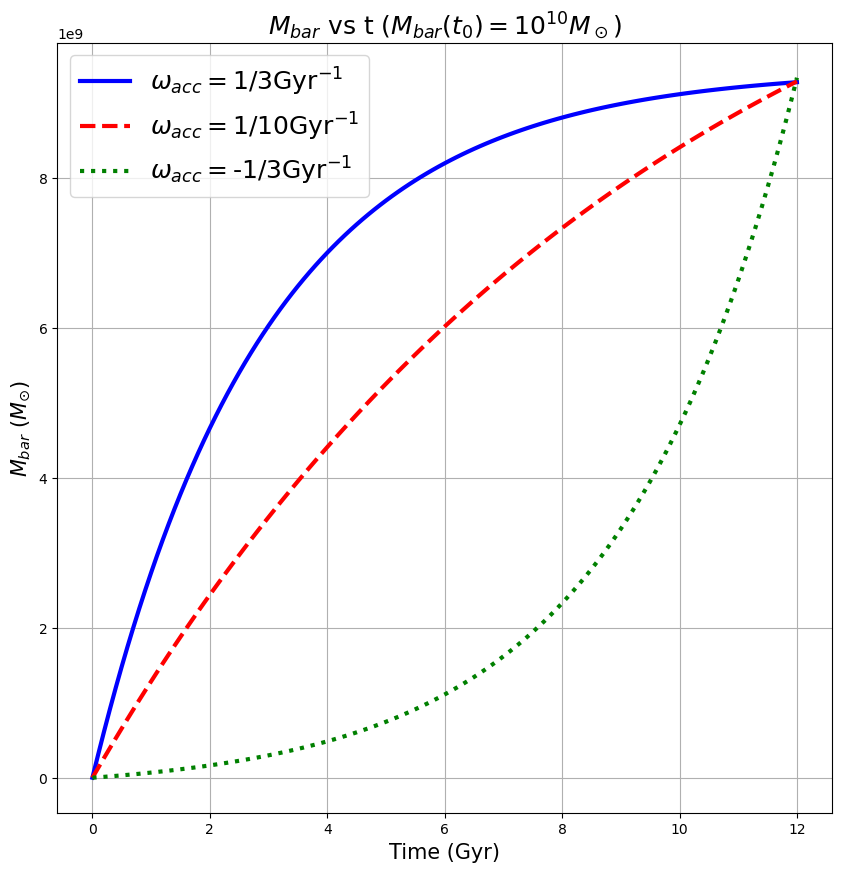

Execution time: 0.2990 seconds


In [39]:
# Mass_time_bar_old_ksl_1 = [np.sum(x) for x in zip(Mass_time_star_old_ksl_1, Mass_gas_summed_old_ksl1)]
# Mass_time_bar_old_ksl_2 = [np.sum(x) for x in zip(Mass_time_star_old_ksl_2, Mass_gas_summed_old_ksl2)]
# Mass_time_bar_old_ksl_3 = [np.sum(x) for x in zip(Mass_time_star_old_ksl_3, Mass_gas_summed_old_ksl3)]

# Mass_time_bar_new_ksl_1 = [np.sum(x) for x in zip(Mass_time_star_new_ksl_1, Mass_gas_summed_new_ksl1)]
# Mass_time_bar_new_ksl_2 = [np.sum(x) for x in zip(Mass_time_star_new_ksl_2, Mass_gas_summed_new_ksl2)]
# Mass_time_bar_new_ksl_3 = [np.sum(x) for x in zip(Mass_time_star_new_ksl_3, Mass_gas_summed_new_ksl3)]

# Mass_time_bar_boissier_1 = [np.sum(x) for x in zip(Mass_time_star_boissier_1, Mass_gas_summed_boissier1)]
# Mass_time_bar_boissier_2 = [np.sum(x) for x in zip(Mass_time_star_boissier_2, Mass_gas_summed_boissier2)]
# Mass_time_bar_boissier_3 = [np.sum(x) for x in zip(Mass_time_star_boissier_3, Mass_gas_summed_boissier3)]

# np.savetxt('../data/data7/Mass_bar1_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', Mass_time_bar_1)
# np.savetxt('../data/data7/Mass_bar2_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', Mass_time_bar_2)
# np.savetxt('../data/data7/Mass_bar3_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', Mass_time_bar_3)

Mass_time_bar_cutoff_ksl_1 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_1, Mass_gas_summed_cutoff_ksl1)]
Mass_time_bar_cutoff_ksl_2 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_2, Mass_gas_summed_cutoff_ksl2)]
Mass_time_bar_cutoff_ksl_3 = [np.sum(x) for x in zip(Mass_time_star_cutoff_ksl_3, Mass_gas_summed_cutoff_ksl3)]

np.savetxt(f'../data/data8_alternative_KSL/Mass_bar1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_1)
np.savetxt(f'../data/data8_alternative_KSL/Mass_bar2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_2)
np.savetxt(f'../data/data8_alternative_KSL/Mass_bar3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', Mass_time_bar_cutoff_ksl_3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_1[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_2[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1[:-1], Mass_time_bar_cutoff_ksl_3[:-1], label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_old_ksl_2[:-1], label=fr"Standard KSL", color="blue", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_new_ksl_2[:-1], label=fr"New Fitted KSL", linestyle="dashed", color="red", lw=3)
# frame.plot(M_times1[:-1], Mass_time_bar_boissier_2[:-1], label=fr"Boissier SFL", linestyle="dotted", color="green", lw=3)
frame.set_title(fr"$M_{{bar}}$ vs t ($M_{{bar}}(t_0)=10^{{{np.log10(M_bar_t0):.0f}}}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$M_{bar}$ $(M_{\odot})$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/M_bar vs time.png')

#  Global $f_{gas}$ vs t

/tmp/ipykernel_1582953/1429854317.py:25: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl1 = np.divide(Mass_gas_summed_cutoff_ksl1, Mass_time_bar_cutoff_ksl_1)
/tmp/ipykernel_1582953/1429854317.py:26: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl2 = np.divide(Mass_gas_summed_cutoff_ksl2, Mass_time_bar_cutoff_ksl_2)
/tmp/ipykernel_1582953/1429854317.py:27: RuntimeWarning: invalid value encountered in divide
  f_global_gas_cutoff_ksl3 = np.divide(Mass_gas_summed_cutoff_ksl3, Mass_time_bar_cutoff_ksl_3)


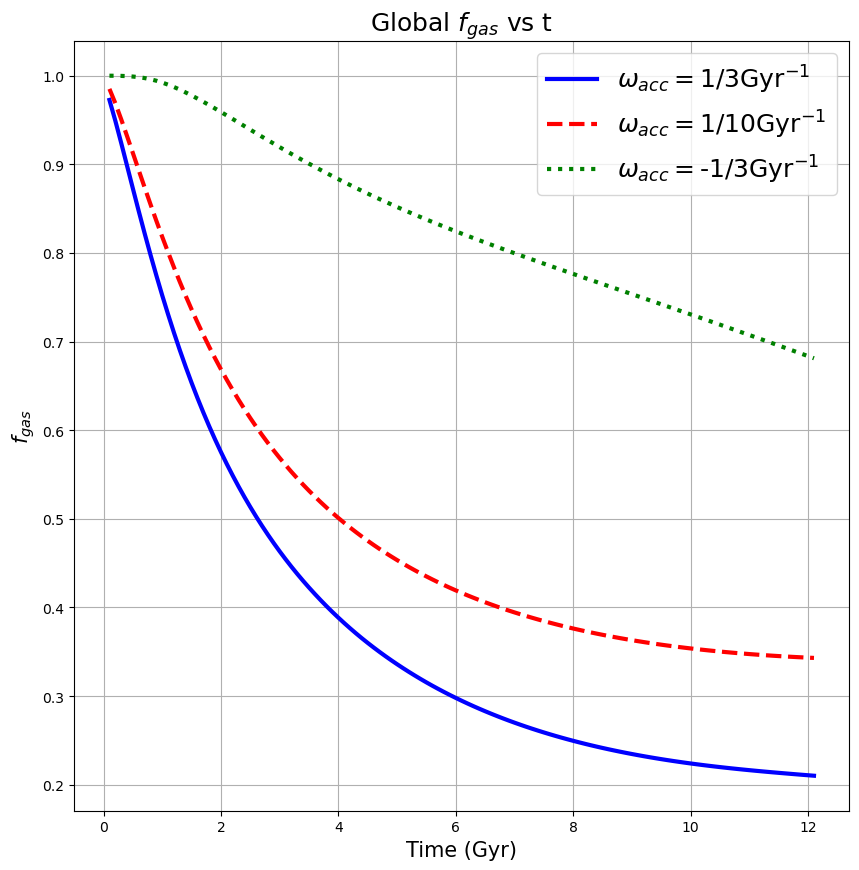

Execution time: 0.2903 seconds


In [40]:
# f_global_gas_old_ksl1 = np.divide(Mass_gas_summed_old_ksl1, Mass_time_bar_old_ksl_1)
# f_global_gas_old_ksl2 = np.divide(Mass_gas_summed_old_ksl2, Mass_time_bar_old_ksl_2)
# f_global_gas_old_ksl3 = np.divide(Mass_gas_summed_old_ksl3, Mass_time_bar_old_ksl_3)

# f_global_gas_new_ksl1 = np.divide(Mass_gas_summed_new_ksl1, Mass_time_bar_new_ksl_1)
# f_global_gas_new_ksl2 = np.divide(Mass_gas_summed_new_ksl2, Mass_time_bar_new_ksl_2)
# f_global_gas_new_ksl3 = np.divide(Mass_gas_summed_new_ksl3, Mass_time_bar_new_ksl_3)

# f_global_gas_boissier1 = np.divide(Mass_gas_summed_boissier1, Mass_time_bar_boissier_1)
# f_global_gas_boissier2 = np.divide(Mass_gas_summed_boissier2, Mass_time_bar_boissier_2)
# f_global_gas_boissier3 = np.divide(Mass_gas_summed_boissier3, Mass_time_bar_boissier_3)

# np.savetxt('../data/data7/f_gas1_vs_t_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', f_global_gas_old_ksl1)
# np.savetxt('../data/data7/f_gas2_vs_t_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', f_global_gas_old_ksl2)
# np.savetxt('../data/data7/f_gas3_vs_t_'+f'{np.log10(M_bar_t0)}_old_ksl.txt', f_global_gas_old_ksl3)

# np.savetxt(f'../data/data7/f_gas1_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', f_global_gas_new_ksl1)
# np.savetxt(f'../data/data7/f_gas2_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', f_global_gas_new_ksl2)
# np.savetxt(f'../data/data7/f_gas3_vs_t_{np.log10(M_bar_t0)}_new_ksl.txt', f_global_gas_new_ksl3)

# np.savetxt(f'../data/data7/f_gas1_vs_t_{np.log10(M_bar_t0)}_boissier.txt', f_global_gas_boissier1)
# np.savetxt(f'../data/data7/f_gas2_vs_t_{np.log10(M_bar_t0)}_boissier.txt', f_global_gas_boissier2)
# np.savetxt(f'../data/data7/f_gas3_vs_t_{np.log10(M_bar_t0)}_boissier.txt', f_global_gas_boissier3)

f_global_gas_cutoff_ksl1 = np.divide(Mass_gas_summed_cutoff_ksl1, Mass_time_bar_cutoff_ksl_1)
f_global_gas_cutoff_ksl2 = np.divide(Mass_gas_summed_cutoff_ksl2, Mass_time_bar_cutoff_ksl_2)
f_global_gas_cutoff_ksl3 = np.divide(Mass_gas_summed_cutoff_ksl3, Mass_time_bar_cutoff_ksl_3)
np.savetxt(f'../data/data8_alternative_KSL/f_gas1_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl1)
np.savetxt(f'../data/data8_alternative_KSL/f_gas2_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl2)
np.savetxt(f'../data/data8_alternative_KSL/f_gas3_vs_t_{np.log10(M_bar_t0)}_cutoff_ksl.txt', f_global_gas_cutoff_ksl3)

fig = figure(figsize=(10,10), facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1, f_global_gas_cutoff_ksl1, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[0]))}Gyr"+r'$^{-1}$', color="blue", lw=3)
frame.plot(M_times1, f_global_gas_cutoff_ksl2, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[1]))}Gyr"+r'$^{-1}$', linestyle="dashed", color="red", lw=3)
frame.plot(M_times1, f_global_gas_cutoff_ksl3, label=r"$\omega_{acc}=$"+f"{Fraction(1, int(t_acc[2]))}Gyr"+r'$^{-1}$', linestyle="dotted", color="green", lw=3)
frame.set_title(r"Global $f_{gas}$ vs t", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$f_{gas}$", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/Global f_gas vs time.png')

# Specific Angular Momentum $j_{bar}$

/tmp/ipykernel_1582953/135477733.py:44: RuntimeWarning: invalid value encountered in divide
  j_bar1 = np.divide(Nominator_bar1, Mass_time_bar_cutoff_ksl_1)
/tmp/ipykernel_1582953/135477733.py:45: RuntimeWarning: invalid value encountered in divide
  j_bar2 = np.divide(Nominator_bar2, Mass_time_bar_cutoff_ksl_2)
/tmp/ipykernel_1582953/135477733.py:46: RuntimeWarning: invalid value encountered in divide
  j_bar3 = np.divide(Nominator_bar3, Mass_time_bar_cutoff_ksl_3)


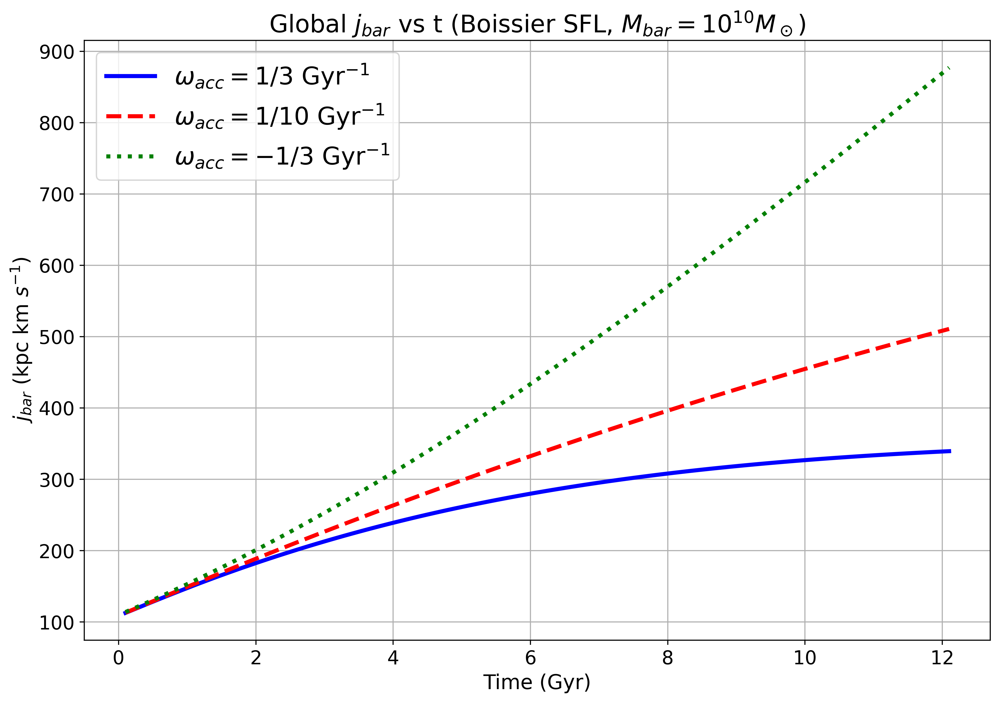

Execution time: 1.6384 seconds


In [41]:
SFL_type = "cutoff_ksl"

# if SFL_type == "old_ksl":
#     Nominator_gas1 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_old_ksl1*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas2 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_old_ksl2*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas3 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_old_ksl3*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

#     sfr_r_squared1 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs[0]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared2 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs[1]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared3 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs[2]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
# elif SFL_type == "new_ksl":
#     Nominator_gas1 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_new_ksl1*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas2 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_new_ksl2*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas3 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_new_ksl3*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

#     sfr_r_squared1 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_ksl[0]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared2 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_ksl[1]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared3 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_ksl[2]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
# elif SFL_type == "boissier":
#     Nominator_gas1 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_boissier1*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas2 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_boissier2*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     Nominator_gas3 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_boissier3*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

#     sfr_r_squared1 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_boissier[0]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared2 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_boissier[1]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
#     sfr_r_squared3 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_boissier[2]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

Nominator_gas1 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl1*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
Nominator_gas2 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl2*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
Nominator_gas3 = 2*np.pi*spint.simpson(integral_r**2*Sigma_gas_cutoff_ksl3*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

sfr_r_squared1 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[0]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
sfr_r_squared2 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[1]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)
sfr_r_squared3 = 2*np.pi*spint.simpson(integral_r**2*M_sfrs_cutoff_ksl[2]*exp_vrot(integral_r, M_bar_t0), dx=dr, axis=0)

Nominator_star1 = dt*np.cumsum(sfr_r_squared1)
Nominator_star2 = dt*np.cumsum(sfr_r_squared2)
Nominator_star3 = dt*np.cumsum(sfr_r_squared3)

Nominator_bar1 = [np.sum(x) for x in zip(Nominator_star1, Nominator_gas1)]
Nominator_bar2 = [np.sum(x) for x in zip(Nominator_star2, Nominator_gas2)]
Nominator_bar3 = [np.sum(x) for x in zip(Nominator_star3, Nominator_gas3)]

j_bar1 = np.divide(Nominator_bar1, Mass_time_bar_cutoff_ksl_1)
j_bar2 = np.divide(Nominator_bar2, Mass_time_bar_cutoff_ksl_2)
j_bar3 = np.divide(Nominator_bar3, Mass_time_bar_cutoff_ksl_3)

np.savetxt('../data/data7/j_bar1_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar1)
np.savetxt('../data/data7/j_bar2_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar2)
np.savetxt('../data/data7/j_bar3_vs_t_'+f'{np.log10(M_bar_t0)}_'+f'{SFL_type}'+'.txt', j_bar3)

fig = figure(figsize=(12,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1, j_bar1/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[0]))}$ Gyr$^{{-1}}$", color="blue", lw=3)
frame.plot(M_times1, j_bar2/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[1]))}$ Gyr$^{{-1}}$", linestyle="dashed", color="red", lw=3)
frame.plot(M_times1, j_bar3/1000, label=fr"$\omega_{{acc}} = {Fraction(1,int(t_acc[2]))}$ Gyr$^{{-1}}$", linestyle="dotted", color="green", lw=3)
frame.set_title(r"Global $j_{bar}$ vs t (Boissier SFL, $M_{bar}=10^{10}M_\odot$)", fontsize = 18)
frame.set_xlabel("Time (Gyr)", fontsize = 15)
frame.set_ylabel(r"$j_{bar}$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.tick_params(labelsize=14)
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/Global j_bar vs time.png')

# Model Definer

In [42]:
def Full_final_definer(Mbar, t_acc_arr, star_formation_law, interpolator, res=120, Rmax=100.1, at_t0=True, ns=1, ks=1):
    """
    Defines the global fraction of gas and baryonic specific angular momentum arrays.
    This function is self-contained; together with the Sigma_definer function, and the functions defining 
    the accretion radius and angular momentum, as well as the baryonic mass and rotational velocity, it 
    alone should give the arrays for the final FINAL graph.
    
    --------------
    Inputs:
        - Mbar (float)           --> Baryonic mass value for which you want to evaluate global gas fraction and 
                                     (specific) angular momentum.
        - t_acc_arr (np.array)   --> Array containing the accretion timescale values. This function now works 
                                     for any number of values within the array!
        - res (float)            --> (optional) Resolution of the radius array; gives the values of the radii at
                                     which values are evaluated. Default is 120 pc.
        - Rmax (float)           --> (optional) Maximum radius to evaluate. Default is 100.1 kpc. Together with
                                     res these defaults were chosen as to optimize run time and convergence of 
                                     specific angular momentum. 
        - at_t0 (bool)           --> (optional) Specifes whether to return just the values today (True), or the 
                                     entire evolution (False). Default is True.
        - ns (float)             --> (optional) Power parameter of the accreting angular momentum form. 
                                     Default is 1.
        - ks (float)             --> (optional) Slope parameter of the accreting angular momentum form. 
                                     Default is 1.
    
    Returns:
        - f_gas_array (np.array) --> Array containing, depending on at_t0, either the values of the global
                                     gas fraction today (t = 12Gyr), or in the entire evolution.
        - j_bar_array (np.array) --> Array containing, depending on at_t0, either the values of the specific
                                     angular momentum today (t = 12Gyr), or in the entire evolution.
    
    """
    
    r = np.arange(0,1000*Rmax,res)
    dr = res
    Mbar_full = np.full(M_times1.shape, Mbar)
    
    SD_gas = np.array([Sigma_definer(r, t_acc, Mbar, SFL_type=star_formation_law, interpolator=interpolator, n=ns, con=ks) for t_acc in t_acc_arr])
    if star_formation_law == "boissier":
        SD_sfr = np.array([SFL(sigma=SD_gas[i], sfl_type=star_formation_law, R=r, Mbar=Mbar_full) for i in range(len(SD_gas))])
    elif star_formation_law == "cutoff_ksl":
        SD_sfr = np.array([sfl_cutoff_array(SD_gas[i]) for i in range(len(SD_gas))])
    else:
        SD_sfr = np.array([SFL(sigma=SD_gas[i], sfl_type=star_formation_law, R=r, Mbar=Mbar) for i in range(len(SD_gas))])
    
    r = r.reshape(len(r),1)
    
    M_gas = np.array([2*np.pi*spint.simpson(r*SD_gas[i], dx=dr, axis=0) for i in range(len(SD_gas))])
    M_sfr = np.array([2*np.pi*spint.simpson(r*SD_sfr[i], dx=dr, axis=0) for i in range(len(SD_gas))])
    M_star = np.array([dt*np.cumsum(M_sfr[i]) for i in range(len(SD_gas))])
    M_bar = np.array([np.array([np.sum(x) for x in zip(M_star[i], M_gas[i])]) for i in range(len(SD_gas))])
    f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])

    #Mbar_allsame = np.full(len(M_bar[0]), M_bar[0][-1])
    #v_rot = v_btfr_def(Mbar_allsame[0])
    rv = rv_def(Mbar)
    
    nominator_gas = np.array([2*np.pi*spint.simpson(r**2*SD_gas[i]*exp_vrot(r, Mbar), dx=dr, axis=0) for i in range(len(SD_gas))])
    nominator_sfr = np.array([2*np.pi*spint.simpson(r**2*SD_sfr[i]*exp_vrot(r, Mbar), dx=dr, axis=0) for i in range(len(SD_gas))])
    nominator_star = np.array([dt*np.cumsum(nominator_sfr[i]) for i in range(len(SD_gas))])
    nominator_bar = np.array([np.array([np.sum(x) for x in zip(nominator_star[i], nominator_gas[i])]) for i in range(len(SD_gas))])
    j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
    j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
    j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])
    
    M_star_t0 = M_star[:,-1]
    M_gas_t0  = M_gas[:,-1]
    
    if (at_t0==True):
        f_gas_array = f_gas_global[:,-1]
        j_bar_array = j_bar[:,-1]/1000
        j_gas_array = j_gas[:,-1]/1000
        j_star_array = j_star[:,-1]/1000
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star_t0, M_gas_t0
    else:
        f_gas_array = f_gas_global
        j_bar_array = j_bar/1000
        j_gas_array = j_gas/1000
        j_star_array = j_star/1000
        return f_gas_array, j_bar_array, j_gas_array, j_star_array, M_star, M_gas

def process_mbar(M, t_acc_array, star_formation_law, interpolator, ns, ks):
    """
    Implements multiprocessing
    """
    return Full_final_definer(10**M, t_acc_array, star_formation_law, interpolator, ns=ns, ks=ks)


Execution time: 0.0067 seconds


## Different $\omega_{acc}$

In [43]:
t_acc_array_ext = np.array([1,3,10,25,-25,-10,-3,-1])
try_f_gas, try_j_bar, try_j_gas, try_j_star, try_ms, try_mg = Full_final_definer(10**10, t_acc_array_ext, star_formation_law="cutoff_ksl", interpolator=r_acc_interpolators, at_t0=False, ns=1, ks=1)
#j_accr = j_acc_def(j_maxer(10**10), 10**10, M_times1, n=1, con=1)

/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/330366526

Execution time: 237.2786 seconds


/tmp/ipykernel_1582953/1842259733.py:52: RuntimeWarning: invalid value encountered in divide
  f_gas_global = np.array([np.divide(M_gas[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_1582953/1842259733.py:62: RuntimeWarning: invalid value encountered in divide
  j_bar = np.array([np.divide(nominator_bar[i], M_bar[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_1582953/1842259733.py:63: RuntimeWarning: invalid value encountered in divide
  j_gas = np.array([np.divide(nominator_gas[i], M_gas[i]) for i in range(len(SD_gas))])
/tmp/ipykernel_1582953/1842259733.py:64: RuntimeWarning: invalid value encountered in divide
  j_star = np.array([np.divide(nominator_star[i], M_star[i]) for i in range(len(SD_gas))])


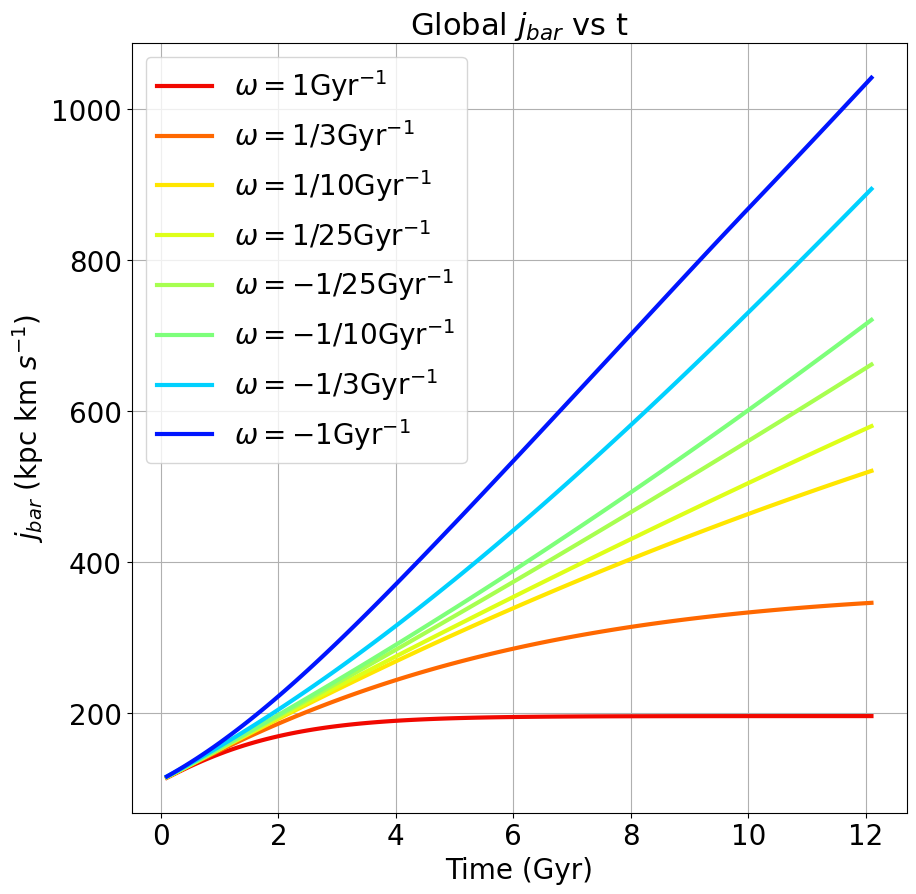

Execution time: 0.2631 seconds


In [44]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")

fig = figure(figsize=(10,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1, try_j_bar[0], label=r"$\omega = 1$Gyr$^{-1}$", color=cmap(try_f_gas[0][-1]), lw=3)
frame.plot(M_times1, try_j_bar[1], label=r"$\omega = 1/3$Gyr$^{-1}$", color=cmap(try_f_gas[1][-1]), lw=3)
frame.plot(M_times1, try_j_bar[2], label=r"$\omega = 1/10$Gyr$^{-1}$", color=cmap(try_f_gas[2][-1]), lw=3)
frame.plot(M_times1, try_j_bar[3], label=r"$\omega = 1/25$Gyr$^{-1}$", color=cmap(try_f_gas[3][-1]), lw=3)
frame.plot(M_times1, try_j_bar[4], label=r"$\omega = -1/25$Gyr$^{-1}$", color=cmap(try_f_gas[4][-1]), lw=3)
frame.plot(M_times1, try_j_bar[5], label=r"$\omega = -1/10$Gyr$^{-1}$", color=cmap(try_f_gas[5][-1]), lw=3)
frame.plot(M_times1, try_j_bar[6], label=r"$\omega = -1/3$Gyr$^{-1}$", color=cmap(try_f_gas[6][-1]), lw=3)
frame.plot(M_times1, try_j_bar[7], label=r"$\omega = -1$Gyr$^{-1}$", color=cmap(try_f_gas[7][-1]), lw=3)
frame.set_title(r"Global $j_{bar}$ vs t", fontsize = 22)
frame.set_xlabel("Time (Gyr)", fontsize = 20)
frame.set_ylabel(r"$j_{bar}$ (kpc km $s^{-1}$)", fontsize = 20)
frame.tick_params(axis="both", labelsize=20)
frame.legend(prop={'size': 20})
frame.grid()
show()

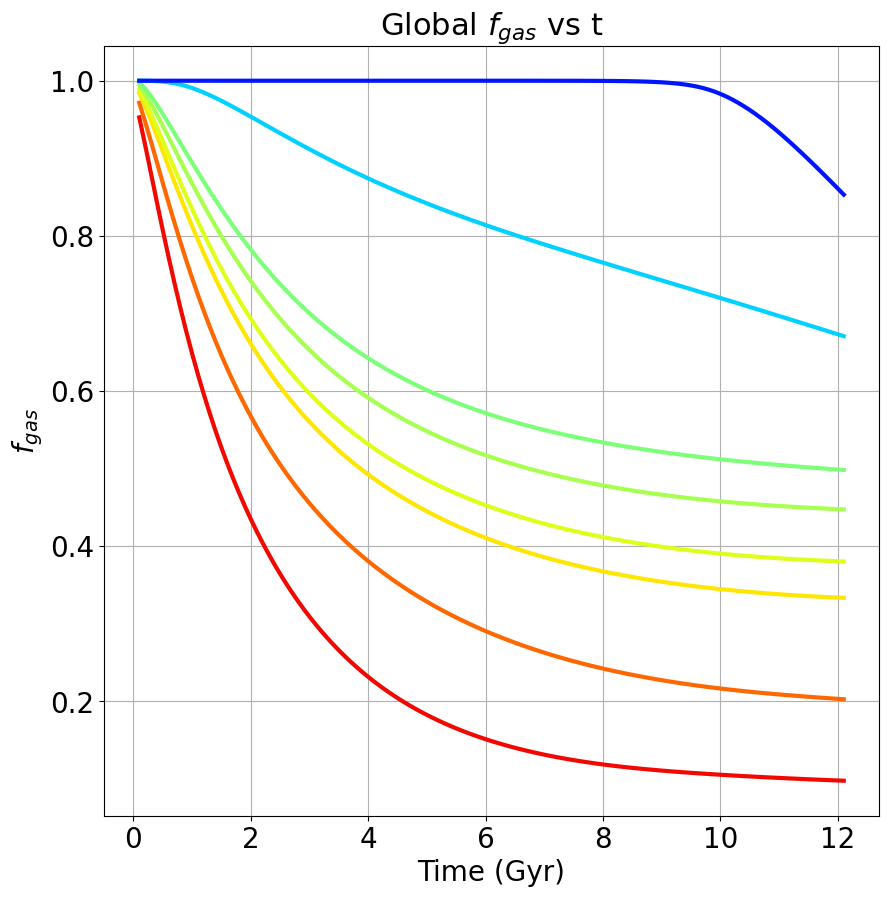

Execution time: 0.1324 seconds


In [45]:
fig = figure(figsize=(10,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)
frame.plot(M_times1, try_f_gas[0], label=r"$\omega = 1$Gyr$^{-1}$", color=cmap(try_f_gas[0][-1]), lw=3)
frame.plot(M_times1, try_f_gas[1], label=r"$\omega = 1/3$Gyr$^{-1}$", color=cmap(try_f_gas[1][-1]), lw=3)
frame.plot(M_times1, try_f_gas[2], label=r"$\omega = 1/10$Gyr$^{-1}$", color=cmap(try_f_gas[2][-1]), lw=3)
frame.plot(M_times1, try_f_gas[3], label=r"$\omega = 1/25$Gyr$^{-1}$", color=cmap(try_f_gas[3][-1]), lw=3)
frame.plot(M_times1, try_f_gas[4], label=r"$\omega = -1/25$Gyr$^{-1}$", color=cmap(try_f_gas[4][-1]), lw=3)
frame.plot(M_times1, try_f_gas[5], label=r"$\omega = -1/10$Gyr$^{-1}$", color=cmap(try_f_gas[5][-1]), lw=3)
frame.plot(M_times1, try_f_gas[6], label=r"$\omega = -1/3$Gyr$^{-1}$", color=cmap(try_f_gas[6][-1]), lw=3)
frame.plot(M_times1, try_f_gas[7], label=r"$\omega = -1$Gyr$^{-1}$", color=cmap(try_f_gas[7][-1]), lw=3)
frame.set_title(r"Global $f_{gas}$ vs t", fontsize = 22)
frame.set_xlabel("Time (Gyr)", fontsize = 20)
frame.set_ylabel(r"$f_{gas}$", fontsize = 20)
frame.tick_params(axis="both", labelsize=20)
#frame.legend(prop={'size': 20})
frame.grid()
show()

## $\dot{M}_{acc}$ vs t

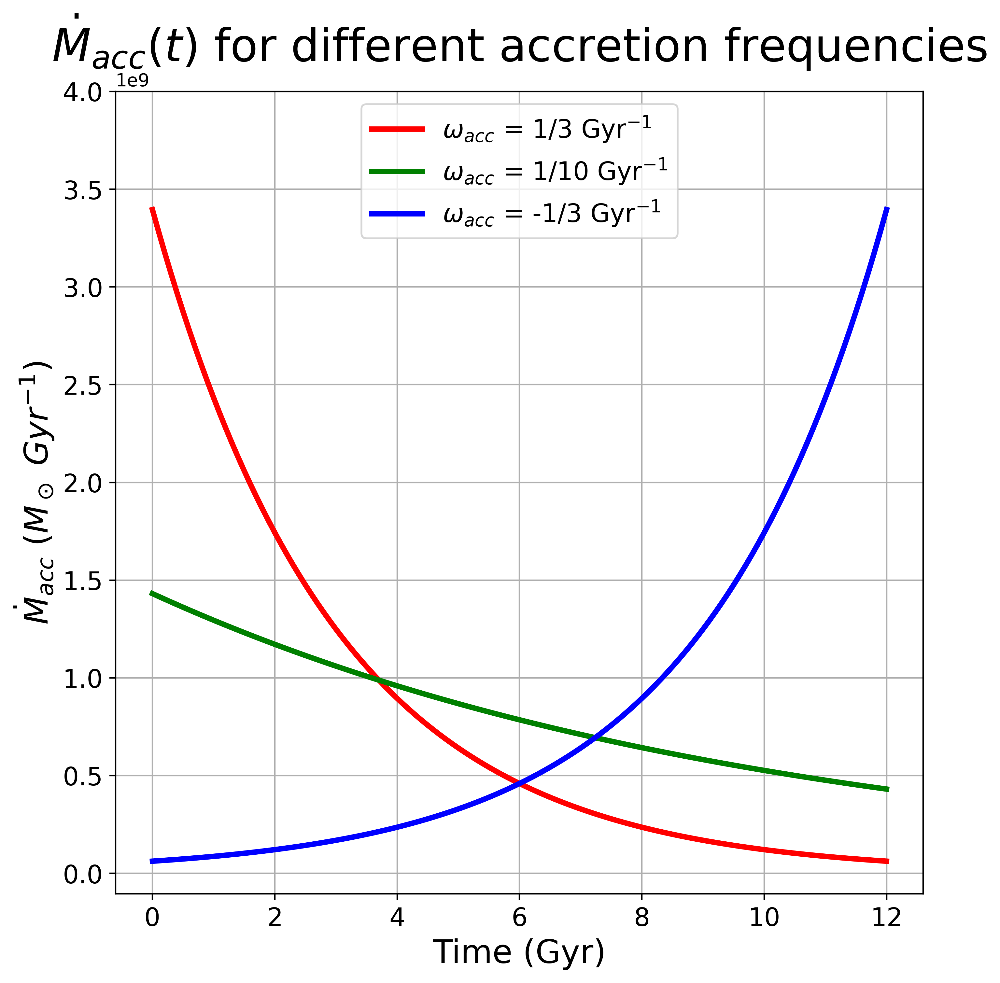

Execution time: 1.2546 seconds


In [46]:
def M_acc_dot_def(M_bar, t, t_acc):
    return C_def(M_bar, t_acc)*np.exp(-t/t_acc)

t_acc_array_ext = np.array([3,10,-3])
colors = ['red', 'green', 'blue']

fig = figure(figsize=(8,8), dpi=400,  facecolor='w')
frame = fig.add_subplot(1,1,1)
for i, col in zip(range(len(t_acc_array_ext)), colors):
    frame.plot(M_times, M_acc_dot_def(10**10, M_times, t_acc_array_ext[i]), label=r"$\omega_{acc}$ = "+f"{Fraction(1,t_acc_array_ext[i])}"+r" Gyr$^{-1}$", color=col, lw=3)
frame.set_title(r"$\dot{M}_{acc}(t)$ for different accretion frequencies", fontsize = 25)
frame.set_xlabel("Time (Gyr)", fontsize = 18)
frame.set_ylabel(r"$\dot{M}_{acc}$ $(M_\odot\ Gyr^{-1})$", fontsize = 18)
frame.set_ylim(ymax=0.4e10)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/M_acc_dot vs t (n=1,k=1)'+f'_{np.log10(M_bar_t0)}'+'.png')

In [47]:
for i in range(len(try_f_gas)):
    print(try_f_gas[i][-1])

0.09780941991498777
0.2027846020345619
0.33352741801050095
0.38037943228662274
0.44751226048193204
0.498369752969612
0.6707905376255888
0.8531868226497309
Execution time: 0.0006 seconds


## Testing (8 $t_{acc}$ and 4 $M_{bar}$)

log_M_bar_array = np.array([8,9,10,11])
t_acc_array = np.array([1,3,10,25,-25,-10,-3,-1])
f_gas_array_4_8 = np.zeros((len(log_M_bar_array),len(t_acc_array)))
j_bar_array_4_8 = np.zeros((len(log_M_bar_array),len(t_acc_array)))

for i,M in enumerate(log_M_bar_array):
    f_gas_temp, j_bar_temp = Full_final_definer(10**M, t_acc_array, star_formation_law="new_ksl", ns=1, ks=1)
    f_gas_array_4_8[i] = f_gas_temp
    j_bar_array_4_8[i] = j_bar_temp

log_j_bar_array_4_8 = np.log10(j_bar_array_4_8)

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10), facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
for x, y, z in zip(log_M_bar_array, log_j_bar_array_4_8, f_gas_array_4_8):
    gg = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=100)
gg.set_label("Model")
cbar1 = fig.colorbar(gg, cax=colbarframe1)
cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

frame.plot(np.linspace(8,11.5,50), np.log10(j_maxer(10**np.linspace(8,11.5,50))), color='k', lw=3.5, linestyle='dashed', alpha=0.6, label=r"$j_{max}$")

#Data
frame.scatter(obs_Mbar, obs_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
#frame.errorbar(obs_Mbar, obs_jbar, xerr=obs_Mbar_errors, yerr=obs_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()

f_gas_array_4_8

# New KSL

## Final Plot (10 $t_{acc}$ and 50 $M_{bar}$)

In [48]:
log_M_bar_array = np.linspace(8,11.5,50)
t_acc_array = np.array([1,2,3,10,25,-25,-10,-3,-2,-1])
f_gas_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),len(t_acc_array)))
j_bar_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),len(t_acc_array)))
j_gas_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),len(t_acc_array)))
j_star_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),len(t_acc_array)))
Mstar_grid = np.zeros_like(f_gas_array_10_50_cutoff_ksl)
Mgas_grid = np.zeros_like(f_gas_array_10_50_cutoff_ksl)
process_mbar_cutoff_ksl = partial(process_mbar, t_acc_array=t_acc_array, star_formation_law="cutoff_ksl", interpolator=r_acc_interpolators, ns=1, ks=1)

with ProcessPoolExecutor() as executor:
    results = list(executor.map(process_mbar_cutoff_ksl, log_M_bar_array))

for i, (f_gas_temp, j_bar_temp, j_gas_temp, j_star_temp, Ms_temp, Mg_temp) in enumerate(results):
    f_gas_array_10_50_cutoff_ksl[i] = f_gas_temp
    j_bar_array_10_50_cutoff_ksl[i] = j_bar_temp
    j_gas_array_10_50_cutoff_ksl[i] = j_gas_temp
    j_star_array_10_50_cutoff_ksl[i] = j_star_temp
    Mstar_grid[i] = Ms_temp
    Mgas_grid[i] = Mg_temp

# for i,M in enumerate(log_M_bar_array):
#     f_gas_temp, j_bar_temp = Full_final_definer(10**M, t_acc_array, star_formation_law="new_ksl", interpolator=r_acc_interpolators, ns=1, ks=1)
#     f_gas_array_10_50_new_ksl[i] = f_gas_temp
#     j_bar_array_10_50_new_ksl[i] = j_bar_temp

np.savetxt('../data/data8_alternative_KSL/final_f_gas_cutoff_ksl.txt', f_gas_array_10_50_cutoff_ksl)
np.savetxt('../data/data8_alternative_KSL/final_j_bar_cutoff_ksl.txt', j_bar_array_10_50_cutoff_ksl)
np.savetxt('../data/data8_alternative_KSL/final_j_gas_cutoff_ksl.txt', j_gas_array_10_50_cutoff_ksl)
np.savetxt('../data/data8_alternative_KSL/final_j_star_cutoff_ksl.txt', j_star_array_10_50_cutoff_ksl)
np.savetxt('../data/data8_alternative_KSL/final_Mstar_grid_cutoff_ksl.txt', Mstar_grid)
np.savetxt('../data/data8_alternative_KSL/final_Mgas_grid_cutoff_ksl.txt', Mgas_grid)

/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/3303665261.py:16: RuntimeWarning: divide by zero encountered in log10
  if np.log10(sigma) < 1.0:
/tmp/ipykernel_1582953/330366526

Execution time: 4779.7008 seconds


### Plot

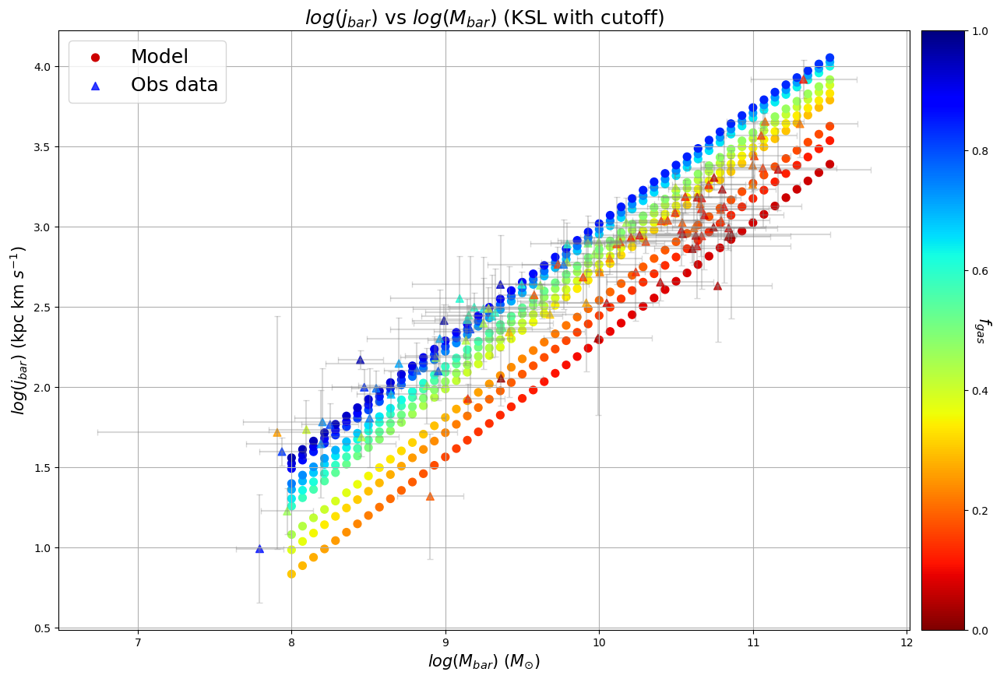

Execution time: 0.5240 seconds


In [49]:
f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data8_alternative_KSL/final_f_gas_cutoff_ksl.txt'))
j_bar_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data8_alternative_KSL/final_j_bar_cutoff_ksl.txt'))
log_M_bar_array = np.linspace(8,11.5,50)
t_acc_array = np.array([1,2,3,10,25,-25,-10,-3,-2,-1])

log_f_gas_array_10_50 = np.log10(f_gas_array_10_50_cutoff_ksl)
log_j_bar_array_10_50 = np.log10(j_bar_array_10_50_cutoff_ksl)

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe1 = divider.append_axes("right", size="5%", pad=0.15)
for x, y, z in zip(log_M_bar_array, log_j_bar_array_10_50, f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=50)
mod.set_label("Model")
cbar1 = fig.colorbar(mod, cax=colbarframe1)
cbar1.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_Mbar, obs_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
frame.errorbar(obs_Mbar, obs_jbar, xerr=obs_Mbar_errors, yerr=obs_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/log j_bar vs log_M_bar with Pavel (50 masses, cutoff KSL).png')

# Interpolate at constant $M_{bar}$

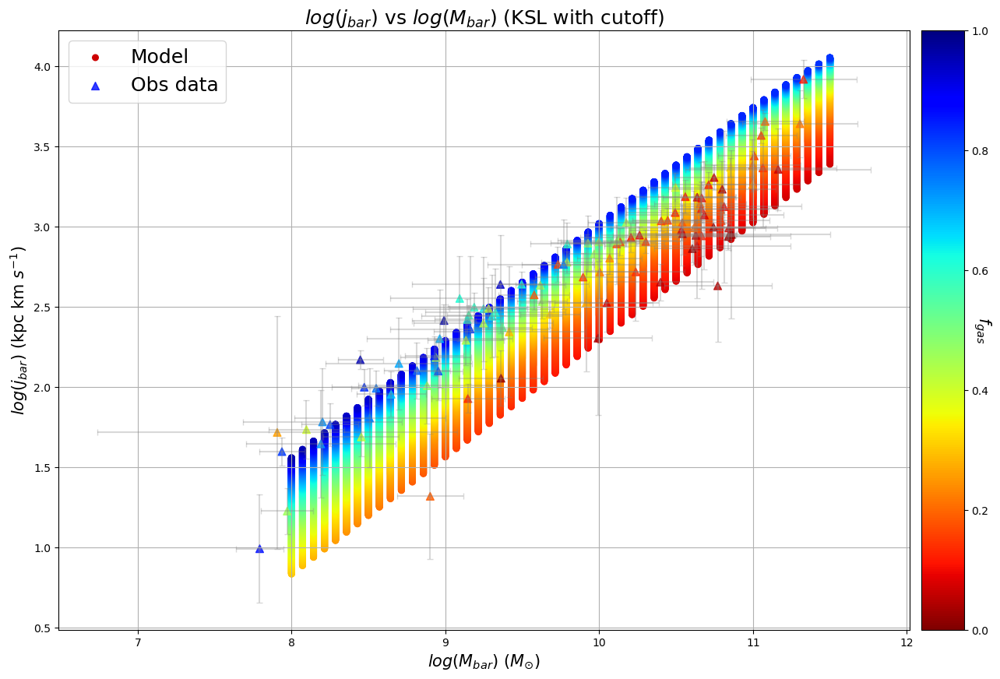

Execution time: 2.3161 seconds


In [50]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10), facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

n=1000
interp_f_gas_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),n))
for i,Mbar in enumerate(log_M_bar_array):
    interp_f_gas_array_10_50_cutoff_ksl[i] = np.linspace(f_gas_array_10_50_cutoff_ksl[i].min(),f_gas_array_10_50_cutoff_ksl[i].max(),n)

interp_j_bar_array_10_50_cutoff_ksl = np.zeros((len(log_M_bar_array),n))
for i,Mbar in enumerate(log_M_bar_array):
    ipl_10_50 = spl.interp1d(f_gas_array_10_50_cutoff_ksl[i], log_j_bar_array_10_50[i], kind='linear')
    interp_j_bar_array_10_50_cutoff_ksl[i] = ipl_10_50(interp_f_gas_array_10_50_cutoff_ksl[i])

for x, y, z in zip(log_M_bar_array, interp_j_bar_array_10_50_cutoff_ksl, interp_f_gas_array_10_50_cutoff_ksl):
    mod = frame.scatter([x]*len(y), y, facecolors=cmap(z), s=30)
mod.set_label("Model")
cbar = fig.colorbar(mod, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

#Data
frame.scatter(obs_Mbar, obs_jbar, label="Obs data", marker="^", facecolors=cmap(BARY['fgas']), s=50, alpha=0.8)
frame.errorbar(obs_Mbar, obs_jbar, xerr=obs_Mbar_errors, yerr=obs_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/log j_bar vs log_M_bar with Pavel (cutoff KSL).png')

## Interpolator

In [51]:
def modelled_j_bar2(f_gas_array, j_bar_array, f_gas_value, kind=1):
    """
    The function takes as input the arrays for f_gas and j_bar (possibly already interpolated), 
    together with a wanted value of f_gas for which to slice out the 1D array. 
    
    ------------
    Inputs:
    - f_gas_array = interpolated 2D array of f_gas
    - j_bar_array = interpolated 2D array of j_bar
    - f_gas_value = value of f_gas for which to slice the f_gas/j_bar arrays
    - kind = Inerpolation type (default is 1 - linear)
    
    The function does the following
    - Creates a list 'index_array', which has the indexes of constant f_gas_value chosen as elements.
    - Then, it iteratively takes from the j_bar_array the values corresponding to the indexes from index_array
    - Finally it interpolates the indexed j_bar_array through the M_bar_array, to get a plottable linear function.
    
    Returns:
    - indexed_M_array_lin = A simple linspace with the initial and final values of the original log_M_bar_array
    """
    indexed_j_array = []
    index_array = []
    true_list = []
    
    for i in range(len(log_M_bar_array)):
        if f_gas_value>np.min(f_gas_array[i]) and f_gas_value<np.max(f_gas_array[i]):
            index_array.append(np.argwhere(f_gas_array[i] == min(f_gas_array[i], key=lambda x:abs(x-f_gas_value))))
            true_list.append(1)
        else:
            index_array.append(0)
            true_list.append(0)
    
    j = 0
    while (j<50):
        if (true_list[j]==1):
            indexed_j_array.append(j_bar_array[j][index_array[j]])
        j += 1
    
    if len(indexed_j_array)>kind:
        index = np.argwhere(np.array(true_list) == 1)
        indexed_M_array = log_M_bar_array[index]
        indexed_M_array_lin = np.linspace(indexed_M_array[0], indexed_M_array[-1], 1000)
        interpolation = spl.InterpolatedUnivariateSpline(indexed_M_array.reshape(len(indexed_M_array),), indexed_j_array, k=kind)
        interpolated_j_array = interpolation(indexed_M_array_lin).reshape(len(indexed_M_array_lin),)
    else:
        indexed_M_array_lin = []
        interpolated_j_array = []
    
    return indexed_M_array_lin, interpolated_j_array

Execution time: 0.0030 seconds


## Final Graph -- interpolation at constant $f_{gas}$

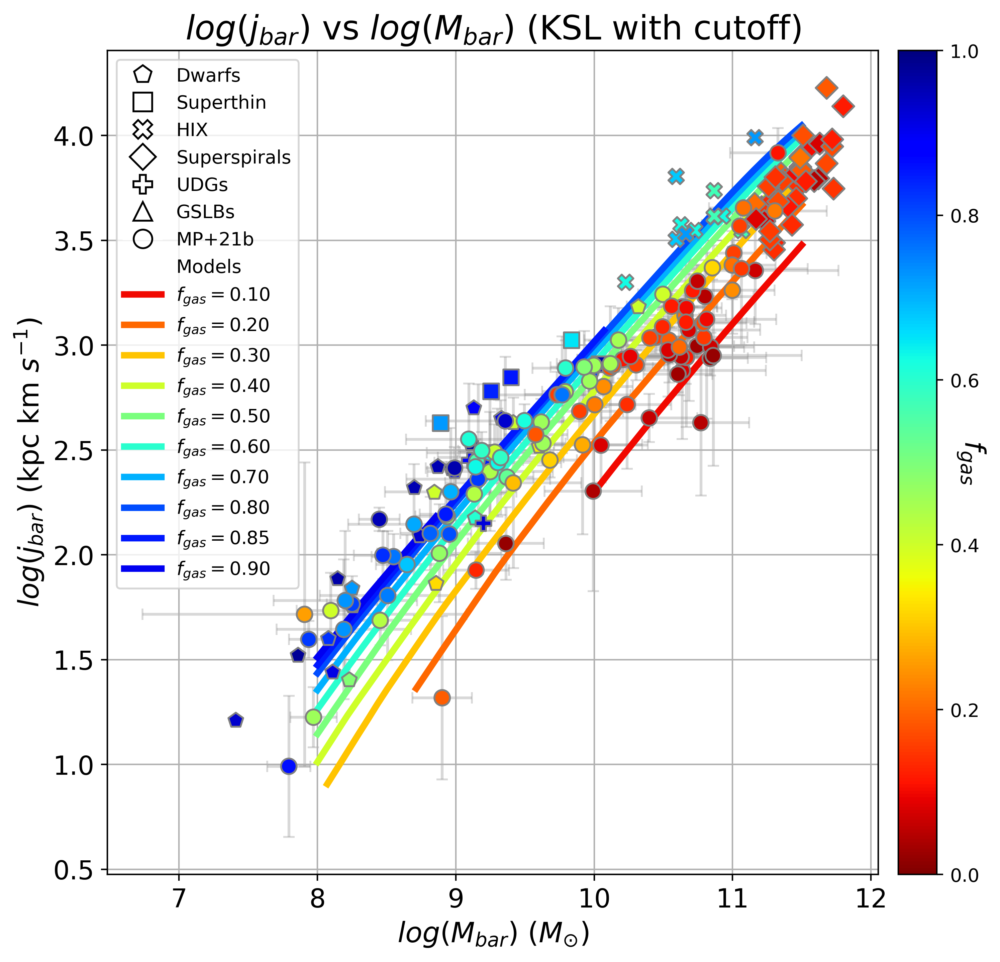

Execution time: 1.6551 seconds


In [52]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400, facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

mods = frame.plot([], [], ' ', label="Models")

f_gas_values = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
colors = cmap(f_gas_values)
ax1s = []
for i,f_gas_value in enumerate(f_gas_values):
    indexed_M_array_lin, indexed_j_array = modelled_j_bar2(interp_f_gas_array_10_50_cutoff_ksl, interp_j_bar_array_10_50_cutoff_ksl, f_gas_value)
    ax1 = frame.plot(indexed_M_array_lin, indexed_j_array, label=r"$f_{gas} = $"+f"{f_gas_value:.2f}", color=colors[i], lw=3.5, zorder=2)
    ax1s.append(ax1[0])

#Data
ax2 = frame.scatter(obs_Mbar, obs_jbar, label="MP+21b", marker="o", facecolors=cmap(BARY['fgas']), edgecolors="grey", s=70, zorder=9)
frame.errorbar(obs_Mbar, obs_jbar, xerr=obs_Mbar_errors, yerr=obs_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=15)

markers = itertools.cycle(('p', 's', 'X', 'D', 'P', '^'))
names = itertools.cycle(('Dwarfs', 'Superthin', 'HIX', 'Superspirals', 'UDGs', 'GSLBs'))
scatter_legends = []
for (idx, df), i in zip(pavel_data.items(), range(3,8)):
    marker = next(markers)
    name = next(names)
    scatter = frame.scatter(df['logMbar'], df['logjbar'], label=name, marker=marker, facecolors=cmap(df['fgas']), edgecolors="grey", s=70, zorder=i)
    scatter_legends.append(scatter)
    
scatter_legend_elements = [
    plt.Line2D([0], [0], marker=marker, color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label=name)
    for marker, name in zip(('p', 's', 'X', 'D', 'P', '^'), ('Dwarfs', 'Superthin', 'HIX', 'Superspirals', 'UDGs', 'GSLBs'))
]
    
legend_elements = scatter_legend_elements + [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='none', markeredgecolor='k', markersize=10, label="MP+21b")] + mods + ax1s

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(handles=legend_elements)
frame.tick_params(labelsize=14)
frame.grid(zorder=1)
show()
fig.savefig('../outputs/graphs9_alternative_KSL/log j_bar vs log_M_bar with Pavel (interpolated, cutoff KSL).png')

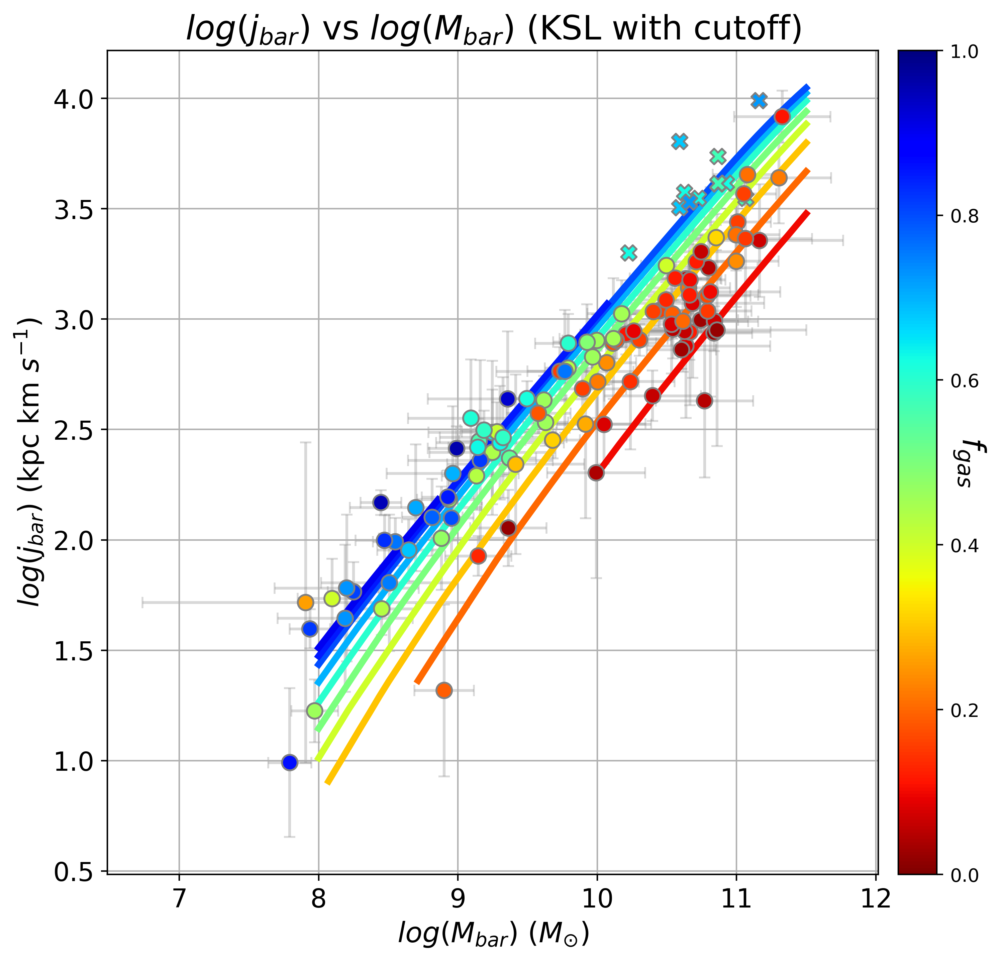

Execution time: 1.3542 seconds


In [53]:
cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(8,8), dpi=400)#, facecolor='w'
frame = fig.add_subplot(1,1,1)

#Model
divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

frame.plot([], [], ' ', label="Models")

f_gas_values = [0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
colors = cmap(f_gas_values)
for i,f_gas_value in enumerate(f_gas_values):
    indexed_M_array_lin, indexed_j_array = modelled_j_bar2(interp_f_gas_array_10_50_cutoff_ksl, interp_j_bar_array_10_50_cutoff_ksl, f_gas_value)
    ax1 = frame.plot(indexed_M_array_lin, indexed_j_array, label=r"$f_{gas} = $"+f"{f_gas_value:.2f}", color=colors[i], lw=3.5, zorder=2)

#frame.plot(log_M_bar_array, np.log10(j_maxer(10**log_M_bar_array)), color='k', lw=3.5, linestyle='dashed', alpha=0.6, label=r"$j_{max}$")

#Data
ax2 = frame.scatter(obs_Mbar, obs_jbar, label="Obs data", marker="o", facecolors=cmap(BARY['fgas']), edgecolors="grey", s=70, zorder=4)
frame.errorbar(obs_Mbar, obs_jbar, xerr=obs_Mbar_errors, yerr=obs_jbar_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=17)

ax3 = frame.scatter(np.log10(10**HIX_logMstar + 10**HIX_logMHI), np.log10(HIX_jbar), label="HIX", marker="X", facecolors=cmap(10**HIX_logMHI/(10**HIX_logMstar + 10**HIX_logMHI)), edgecolors="grey", s=70, zorder=3)

frame.set_title(r"$log(j_{bar})$ vs $log(M_{bar})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{bar})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 15)
#frame.legend(prop={'size': 12})
frame.tick_params(labelsize=14)
frame.grid(zorder=1)
show()
fig.savefig('../outputs/graphs9_alternative_KSL/log j_bar vs log_M_bar with Pavel (interpolated, cutoff KSL, no legend).png')

In [54]:
pavel_data

{'dwarfs_elson':         UGC     v0    rpe   100a   M2L   mbar      Jb      jb     D    Mr  \
 0    2034.0   29.1   12.3    6.2  1.04   13.8    20.6   149.6  10.1 -17.2   
 1    3371.0   99.1   66.0   -2.8  1.87   26.0   111.0   426.2  12.8 -17.7   
 2    3711.0   92.2   12.0    0.3  0.46    7.0    14.0   198.3   8.6 -17.8   
 3    3966.0   42.7   10.2    2.1  0.08    1.4     1.1    76.8   6.0 -14.9   
 4    4173.0   27.9   20.3   14.0  2.88   40.1   132.0   329.0  16.8 -17.8   
 5    4543.0   56.5    2.4    0.3  0.56   96.1   708.5   736.5  30.3 -19.2   
 6    5272.0    9.2    9.1   58.8  0.20    1.8     1.0    57.0   6.1 -15.1   
 7    7047.0    5.9    2.3   13.8  0.25    1.2     0.5    39.8   3.5 -15.2   
 8    7232.0   11.7   10.0   46.0  0.95    1.7     0.4    25.3   3.5 -15.3   
 9    7971.0  571.1  535.0 -281.9  1.02    7.2     5.2    72.9   8.4 -17.1   
 10   9211.0   91.0   42.4   -8.0  0.52    9.8    24.5   249.3  12.6 -16.2   
 11  11861.0  206.9   58.2   -7.7  0.86  208.8  

Execution time: 0.0327 seconds


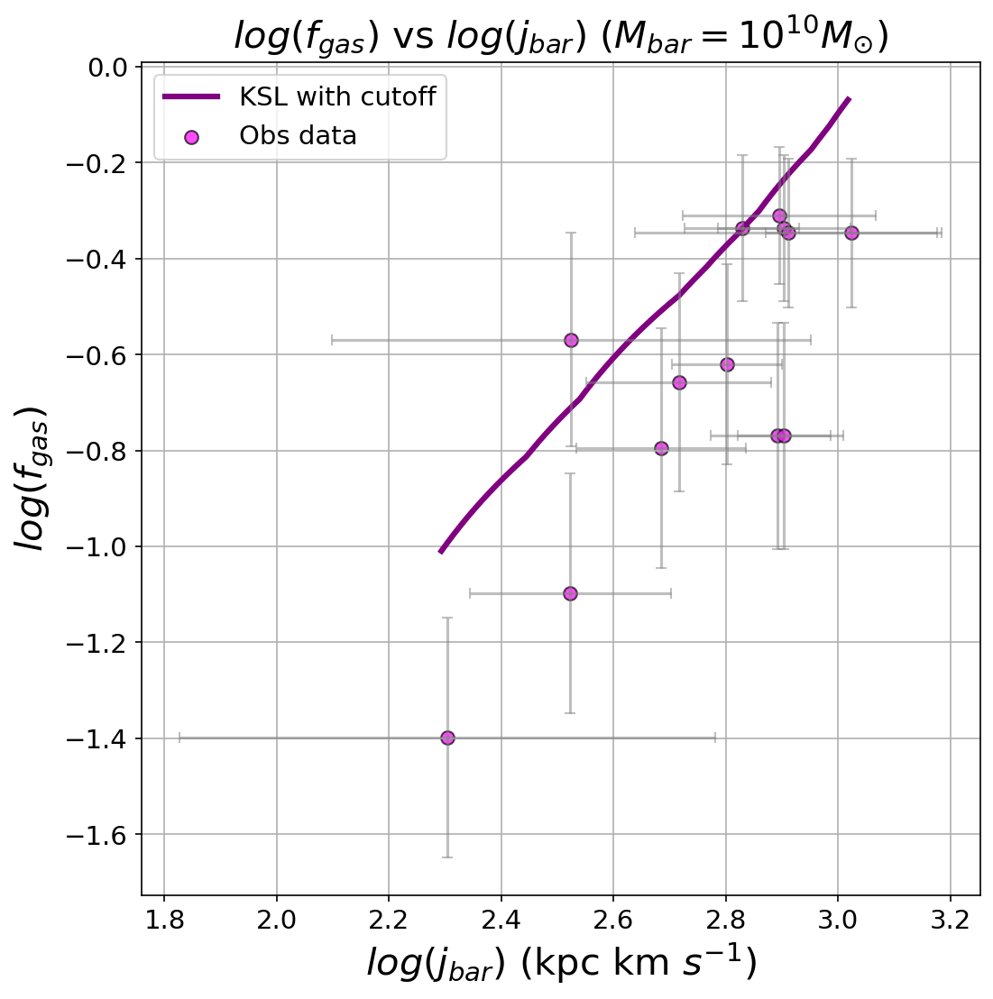

Execution time: 0.2314 seconds


In [55]:
BARY_10 = pd.read_csv('../data/baryons_10.csv')

BARY_10['j'] =  pd.to_numeric(BARY_10['j'], errors='coerce')
BARY_10['e_j'] =  pd.to_numeric(BARY_10['e_j'], errors='coerce')
BARY_10['fgas'] =  pd.to_numeric(BARY_10['fgas'], errors='coerce')
BARY_10['e_fgas'] =  pd.to_numeric(BARY_10['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_10['fgas'])
obs_fgas_errors_10 = BARY_10['e_fgas']/BARY_10['fgas']
obs_jbar_10 = np.log10(BARY_10['j'])
obs_jbar_errors_10 = BARY_10['e_j']/BARY_10['j']

M_bar_index_10 = np.argwhere(log_M_bar_array == 10)[0][0]

HIX_indices_10 = np.where((HIX_logMbar >= 9.8) & (HIX_logMbar <= 10.2))[0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_10]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_10]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_10], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_10]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_10], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_10]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
#frame.scatter(np.log10(HIX_fgas[HIX_indices_10]), np.log10(HIX_jbar[HIX_indices_10]), label="HIX", marker="X", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{10} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1.75,0)
frame.grid()
show()

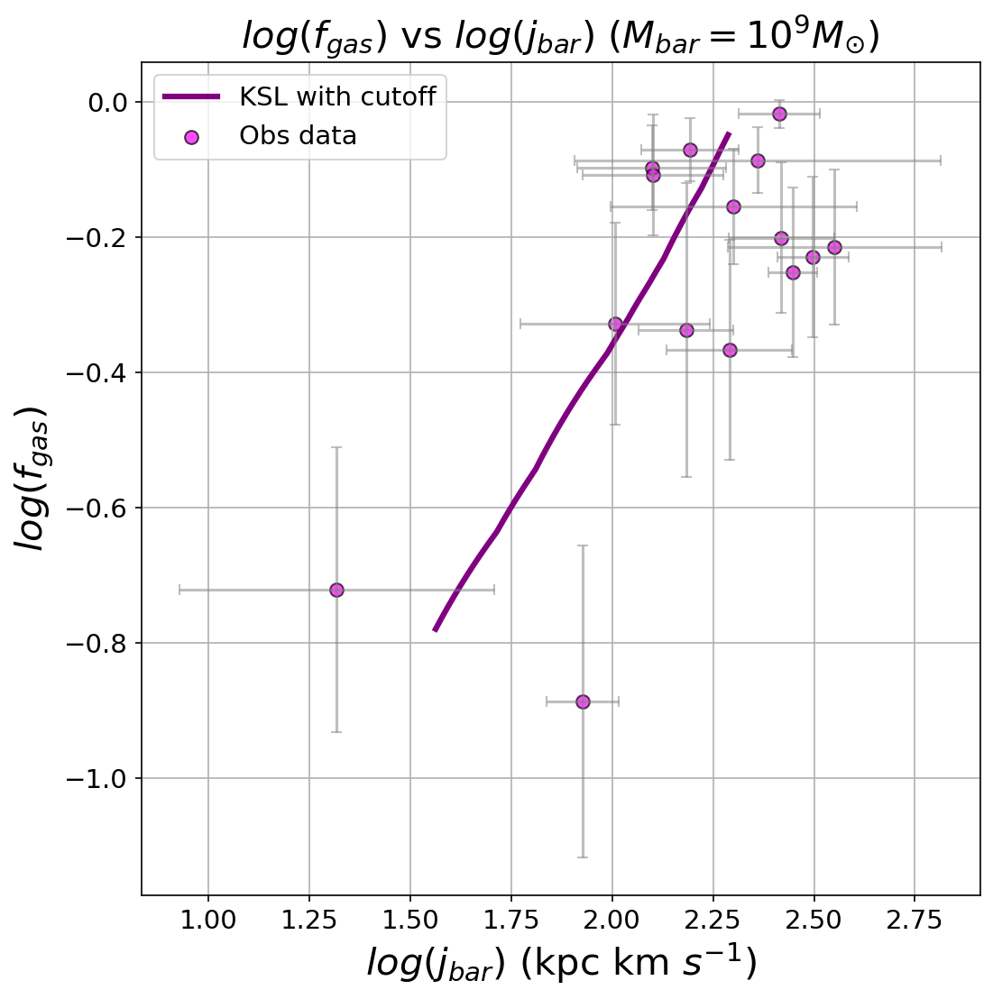

Execution time: 0.2116 seconds


In [56]:
BARY_9 = pd.read_csv('../data/baryons_9.csv')

BARY_9['j'] =  pd.to_numeric(BARY_9['j'], errors='coerce')
BARY_9['e_j'] =  pd.to_numeric(BARY_9['e_j'], errors='coerce')
BARY_9['fgas'] =  pd.to_numeric(BARY_9['fgas'], errors='coerce')
BARY_9['e_fgas'] =  pd.to_numeric(BARY_9['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_9['fgas'])
obs_fgas_errors_10 = BARY_9['e_fgas']/BARY_9['fgas']
obs_jbar_10 = np.log10(BARY_9['j'])
obs_jbar_errors_10 = BARY_9['e_j']/BARY_9['j']

M_bar_index_9 = np.argwhere(log_M_bar_array == 9)[0][0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_9]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_9]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_9], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_9]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_9], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_9]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{9} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1,0)
frame.grid()
show()

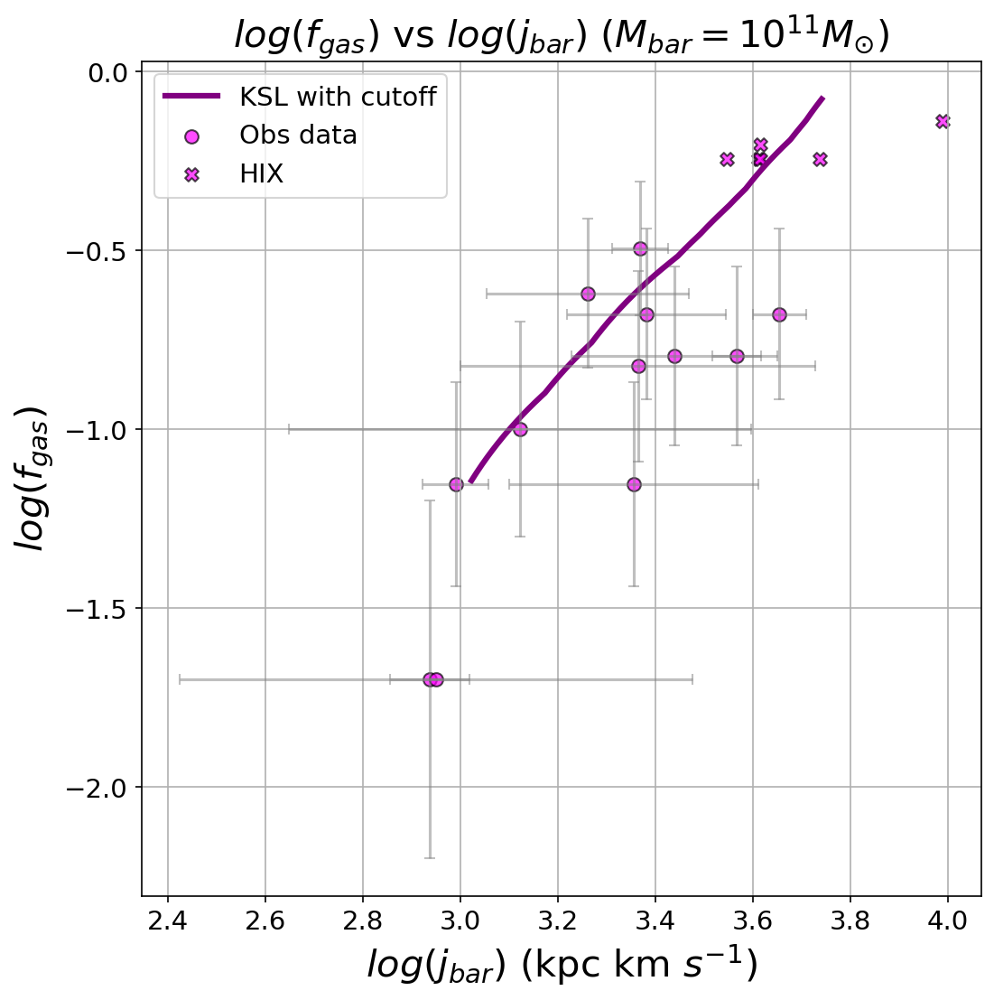

Execution time: 0.3604 seconds


In [57]:
BARY_11 = pd.read_csv('../data/baryons_11.csv')

BARY_11['j'] =  pd.to_numeric(BARY_11['j'], errors='coerce')
BARY_11['e_j'] =  pd.to_numeric(BARY_11['e_j'], errors='coerce')
BARY_11['fgas'] =  pd.to_numeric(BARY_11['fgas'], errors='coerce')
BARY_11['e_fgas'] =  pd.to_numeric(BARY_11['e_fgas'], errors='coerce')

obs_fgas_10 = np.log10(BARY_11['fgas'])
obs_fgas_errors_10 = BARY_11['e_fgas']/BARY_11['fgas']
obs_jbar_10 = np.log10(BARY_11['j'])
obs_jbar_errors_10 = BARY_11['e_j']/BARY_11['j']

M_bar_index_11 = np.argwhere(log_M_bar_array == 11)[0][0]

HIX_indices_11 = np.where((HIX_logMbar >= 10.8) & (HIX_logMbar <= 11.2))[0]

fig = figure(figsize=(8,8), dpi=150, facecolor='w')
frame = fig.add_subplot(1,1,1)
# frame.plot(interp_j_bar_array_10_50_old_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_old_ksl[M_bar_index_11]), label="Standard KSL", color="b", lw=3)
# frame.plot(interp_j_bar_array_10_50_new_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_new_ksl[M_bar_index_11]), label="New Fitted KSL", color="r", lw=3, ls='--')
# frame.plot(interp_j_bar_array_10_50_boissier[M_bar_index_11], np.log10(interp_f_gas_array_10_50_boissier[M_bar_index_11]), label="Boissier SFL", color="g", lw=3, ls='dotted')
frame.plot(interp_j_bar_array_10_50_cutoff_ksl[M_bar_index_11], np.log10(interp_f_gas_array_10_50_cutoff_ksl[M_bar_index_11]), label="KSL with cutoff", color="purple", lw=3)
frame.scatter(obs_jbar_10, obs_fgas_10, label="Obs data", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.errorbar(obs_jbar_10, obs_fgas_10, xerr=obs_jbar_errors_10, yerr=obs_fgas_errors_10, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.5)
frame.scatter(np.log10(HIX_jbar[HIX_indices_11]), np.log10(HIX_fgas[HIX_indices_11]), label="HIX", marker="X", facecolors='magenta', edgecolors='k', s=50, alpha=0.7)
frame.set_title(r"$log(f_{gas})$ vs $log(j_{bar})$ ($M_{bar} = 10^{11} M_{\odot}$)", fontsize = 20)
frame.set_ylabel(r"$log(f_{gas})$", fontsize = 20)
frame.set_xlabel(r"$log(j_{bar})$ (kpc km $s^{-1}$)", fontsize = 20)
frame.legend(prop={'size': 14})
frame.tick_params(labelsize=14)
#frame.set_xlim(-1,0)
frame.grid()
show()

### Stellar Relation

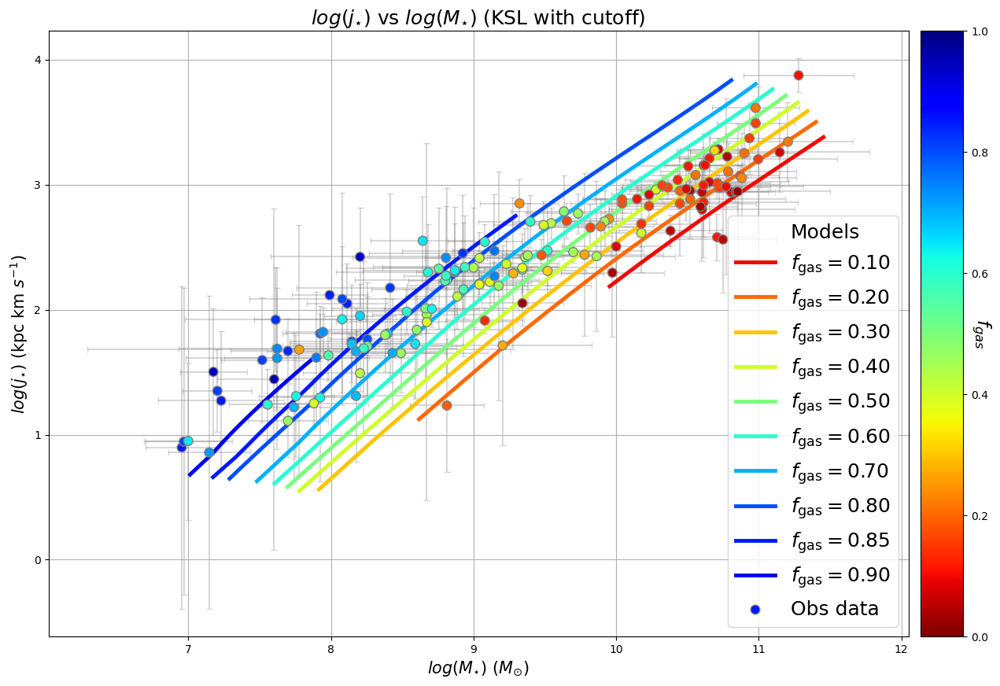

Execution time: 0.6085 seconds


In [60]:
# Final plot with j_star and M_star instead of j_bar and M_bar

f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data8_alternative_KSL/final_f_gas_cutoff_ksl.txt'))
j_star_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data8_alternative_KSL/final_j_star_cutoff_ksl.txt'))
M_star_array_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data8_alternative_KSL/final_Mstar_grid_cutoff_ksl.txt'))
log_M_star_array = np.linspace(7,11.5,50)
t_acc_array = np.array([1,2,3,10,25,-25,-10,-3,-2,-1])

# use the MODEL arrays for interpolation (not the fixed log_M_star_array grid)
log_j_star_array_10_50 = np.log10(
    j_star_array_10_50_cutoff_ksl,
    where=(j_star_array_10_50_cutoff_ksl > 0),
    out=np.full_like(j_star_array_10_50_cutoff_ksl, np.nan)
)

f_to_logMstar = []
f_to_logjstar = []
for i in range(f_gas_array_10_50_cutoff_ksl.shape[0]):
    m = (np.isfinite(f_gas_array_10_50_cutoff_ksl[i]) &
         np.isfinite(M_star_array_cutoff_ksl[i]) & (M_star_array_cutoff_ksl[i] > 0) &
         np.isfinite(log_j_star_array_10_50[i]))
    if m.sum() < 2:
        f_to_logMstar.append(None); f_to_logjstar.append(None); continue

    # sort by f_gas and de-duplicate to keep x strictly increasing
    order = np.argsort(f_gas_array_10_50_cutoff_ksl[i, m])
    fg = f_gas_array_10_50_cutoff_ksl[i, m][order]
    xM = np.log10(M_star_array_cutoff_ksl[i, m][order])
    yJ = log_j_star_array_10_50[i, m][order]
    uniq, uidx = np.unique(fg, return_index=True)
    fg = uniq
    x = xM[uidx]
    y = yJ[uidx]

    f_to_logMstar.append(spl.interp1d(fg, x, kind='linear', bounds_error=False, fill_value=np.nan))
    f_to_logjstar.append(spl.interp1d(fg, y, kind='linear', bounds_error=False, fill_value=np.nan))

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
frame.plot([], [], ' ', label="Models")

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

f_gas_values = [0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
for fg, col in zip(f_gas_values, cmap(f_gas_values)):
    # evaluate both x and y at the same f_gas
    xs = np.array([f(fg) if f is not None else np.nan for f in f_to_logMstar])
    ys = np.array([g(fg) if g is not None else np.nan for g in f_to_logjstar])
    m = np.isfinite(xs) & np.isfinite(ys)
    if m.sum() < 2: 
        continue
    order = np.argsort(xs[m])  # make the line monotonic in M*
    ax1 = frame.plot(xs[m][order], ys[m][order], lw=3.5, color=col, label=fr"$f_{{\rm gas}}={fg:.2f}$", zorder=2)

#Data
ax2 = frame.scatter(obs_Mstar, obs_jstar, label="Obs data", marker="o",
                    facecolors=cmap(obs_fgas_but_for_stars_and_gas), edgecolors="grey", s=70, zorder=4)
frame.errorbar(obs_Mstar, obs_jstar, xerr=obs_Mstar_errors, yerr=obs_jstar_errors,
               fmt=' ', ecolor='grey', capsize=3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=17)

frame.set_title(r"$log(j_{\star})$ vs $log(M_{\star})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{\star})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{\star})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/log j_star vs log_M_star with Pavel (interpolated, cutoff KSL, no legend).png')


### Gas Relation

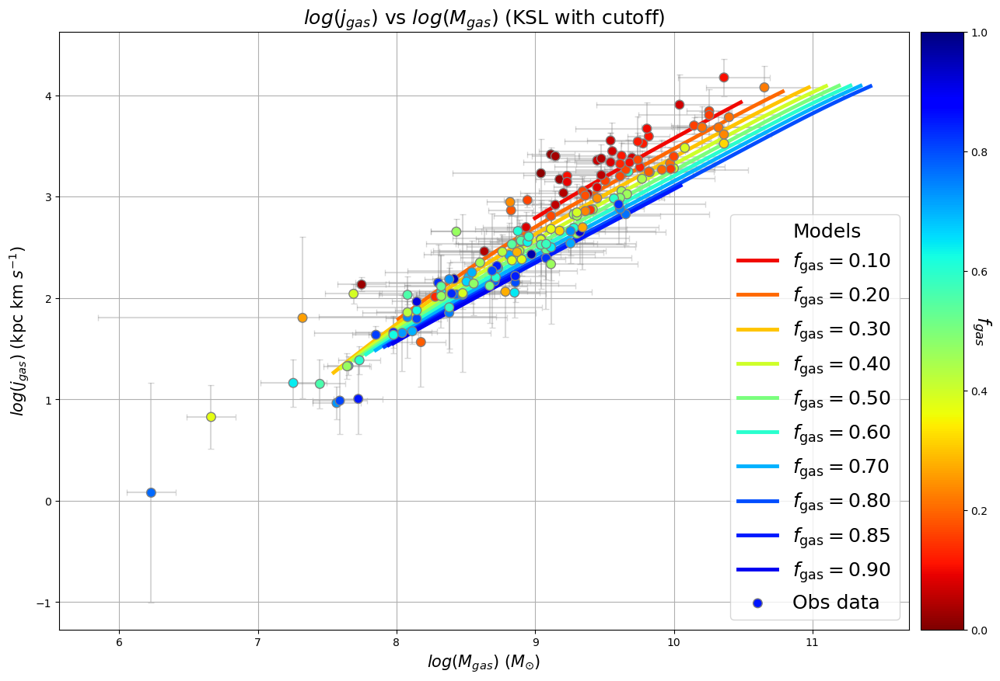

Execution time: 0.5871 seconds


In [61]:
# Final plot with j_star and M_star instead of j_bar and M_bar

f_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data8_alternative_KSL/final_f_gas_cutoff_ksl.txt'))
j_gas_array_10_50_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data8_alternative_KSL/final_j_gas_cutoff_ksl.txt'))
M_gas_array_cutoff_ksl = np.nan_to_num(np.loadtxt('../data/data8_alternative_KSL/final_Mgas_grid_cutoff_ksl.txt'))
t_acc_array = np.array([1,2,3,10,25,-25,-10,-3,-2,-1])

# use the MODEL arrays for interpolation (not the fixed log_M_star_array grid)
log_j_gas_array_10_50 = np.log10(
    j_gas_array_10_50_cutoff_ksl,
    where=(j_gas_array_10_50_cutoff_ksl > 0),
    out=np.full_like(j_gas_array_10_50_cutoff_ksl, np.nan)
)

f_to_logMgas = []
f_to_logjgas = []
for i in range(f_gas_array_10_50_cutoff_ksl.shape[0]):
    m = (np.isfinite(f_gas_array_10_50_cutoff_ksl[i]) &
         np.isfinite(M_gas_array_cutoff_ksl[i]) & (M_gas_array_cutoff_ksl[i] > 0) &
         np.isfinite(log_j_gas_array_10_50[i]))
    if m.sum() < 2:
        f_to_logMgas.append(None); f_to_logjgas.append(None); continue

    # sort by f_gas and de-duplicate to keep x strictly increasing
    order = np.argsort(f_gas_array_10_50_cutoff_ksl[i, m])
    fg = f_gas_array_10_50_cutoff_ksl[i, m][order]
    xM = np.log10(M_gas_array_cutoff_ksl[i, m][order])
    yJ = log_j_gas_array_10_50[i, m][order]
    uniq, uidx = np.unique(fg, return_index=True)
    fg = uniq
    x = xM[uidx]
    y = yJ[uidx]

    f_to_logMgas.append(spl.interp1d(fg, x, kind='linear', bounds_error=False, fill_value=np.nan))
    f_to_logjgas.append(spl.interp1d(fg, y, kind='linear', bounds_error=False, fill_value=np.nan))

cmap = cm.jet_r
mpl.rc("image", cmap="jet_r")
fig = figure(figsize=(15,10),  facecolor='w')
frame = fig.add_subplot(1,1,1)

#Model
frame.plot([], [], ' ', label="Models")

divider = make_axes_locatable(frame)
colbarframe = divider.append_axes("right", size="5%", pad=0.15)

f_gas_values = [0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.85,0.9]
for fg, col in zip(f_gas_values, cmap(f_gas_values)):
    # evaluate both x and y at the same f_gas
    xs = np.array([f(fg) if f is not None else np.nan for f in f_to_logMgas])
    ys = np.array([g(fg) if g is not None else np.nan for g in f_to_logjgas])
    m = np.isfinite(xs) & np.isfinite(ys)
    if m.sum() < 2: 
        continue
    order = np.argsort(xs[m])  # make the line monotonic in M*
    ax1 = frame.plot(xs[m][order], ys[m][order], lw=3.5, color=col, label=fr"$f_{{\rm gas}}={fg:.2f}$", zorder=2)

#Data
ax2 = frame.scatter(obs_Mgas, obs_jgas, label="Obs data", marker="o", facecolors=cmap(obs_fgas_but_for_stars_and_gas), edgecolors="grey", s=70, zorder=4)
frame.errorbar(obs_Mgas, obs_jgas, xerr=obs_Mgas_errors, yerr=obs_jgas_errors, fmt = ' ', ecolor = 'grey', capsize = 3, alpha=0.3, zorder=0)
cbar = fig.colorbar(ax2, cax=colbarframe)
cbar.set_label(r"$f_{gas}$", rotation=270, fontsize=17)

frame.set_title(r"$log(j_{gas})$ vs $log(M_{gas})$ (KSL with cutoff)", fontsize = 18)
frame.set_xlabel(r"$log(M_{gas})$ $(M_{\odot})$", fontsize = 15)
frame.set_ylabel(r"$log(j_{gas})$ (kpc km $s^{-1}$)", fontsize = 15)
frame.legend(prop={'size': 18})
frame.grid()
show()
fig.savefig('../outputs/graphs9_alternative_KSL/log j_gas vs log_M_gas with Pavel (interpolated, cutoff KSL, no legend).png')